In [21]:
import sys
sys.path.append("../") # adding the path to read the utils file
from sklearnex import patch_sklearn
patch_sklearn(global_patch=True)
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, StratifiedKFold
from catboost import CatBoostClassifier
from sklearn import metrics, tree
from shap import TreeExplainer
import fasttreeshap
from shap import plots, Explanation
import graphviz 
from yellowbrick.model_selection import LearningCurve
import time
import shap
from utils import *
import pickle
import glob
from yellowbrick.classifier import ROCAUC
from yellowbrick.contrib.wrapper import wrap

pd.set_option('display.max_columns', None)

Scikit-learn was successfully globally patched by Intel(R) Extension for Scikit-learn


Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [2]:
ds = pd.concat([pd.read_csv(csv_file, engine='pyarrow', index_col='id') for csv_file in glob.glob('../datasets/NFS-2023-TE/*.csv')], ignore_index=True)
ds.head()

,expiration_id,src_ip,src_mac,src_oui,src_port,dst_ip,dst_mac,dst_oui,dst_port,protocol,ip_version,vlan_id,bidirectional_first_seen_ms,bidirectional_last_seen_ms,bidirectional_duration_ms,bidirectional_packets,bidirectional_bytes,src2dst_first_seen_ms,src2dst_last_seen_ms,src2dst_duration_ms,src2dst_packets,src2dst_bytes,dst2src_first_seen_ms,dst2src_last_seen_ms,dst2src_duration_ms,dst2src_packets,dst2src_bytes,bidirectional_min_ps,bidirectional_mean_ps,bidirectional_stddev_ps,bidirectional_max_ps,src2dst_min_ps,src2dst_mean_ps,src2dst_stddev_ps,src2dst_max_ps,dst2src_min_ps,dst2src_mean_ps,dst2src_stddev_ps,dst2src_max_ps,bidirectional_min_piat_ms,bidirectional_mean_piat_ms,bidirectional_stddev_piat_ms,bidirectional_max_piat_ms,src2dst_min_piat_ms,src2dst_mean_piat_ms,src2dst_stddev_piat_ms,src2dst_max_piat_ms,dst2src_min_piat_ms,dst2src_mean_piat_ms,dst2src_stddev_piat_ms,dst2src_max_piat_ms,bidirectional_syn_packets,bidirectional_cwr_packets,bidirectional_ece_packets,bidirectional_urg_packets,bidirectional_ack_packets,bidirectional_psh_packets,bidirectional_rst_packets,bidirectional_fin_packets,src2dst_syn_packets,src2dst_cwr_packets,src2dst_ece_packets,src2dst_urg_packets,src2dst_ack_packets,src2dst_psh_packets,src2dst_rst_packets,src2dst_fin_packets,dst2src_syn_packets,dst2src_cwr_packets,dst2src_ece_packets,dst2src_urg_packets,dst2src_ack_packets,dst2src_psh_packets,dst2src_rst_packets,dst2src_fin_packets,label
0,-1,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1031,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,6,4,0,1499428835357,1499428835358,1,6,800,1499428835357,1499428835358,1,4,473,1499428835357,1499428835358,1,2,327,60,133.333333,109.302638,287,60,118.25,112.535550,287,66,163.5,137.885822,261,0,0.200000,0.447214,1,0,0.333333,0.57735,1,1,1.0,0.000000,1,2,0,0,0,5,2,0,1,1,0,0,0,3,1,0,1,1,0,0,0,2,1,0,0,BENIGN
1,-1,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1031,6,4,0,1499428835358,1499428835358,0,2,120,1499428835358,1499428835358,0,2,120,0,0,0,0,0,60,60.000000,0.000000,60,60,60.00,0.000000,60,0,0.0,0.000000,0,0,0.000000,0.000000,0,0,0.000000,0.00000,0,0,0.0,0.000000,0,0,0,0,0,2,0,1,0,0,0,0,0,2,0,1,0,0,0,0,0,0,0,0,0,BENIGN
2,-1,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1032,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,6,4,0,1499428835374,1499428835375,1,7,2265,1499428835374,1499428835375,1,5,613,1499428835374,1499428835375,1,2,1652,60,323.571429,568.141372,1586,60,122.60,136.648454,367,66,826.0,1074.802307,1586,0,0.166667,0.408248,1,0,0.250000,0.50000,1,1,1.0,0.000000,1,2,0,0,0,6,2,0,1,1,0,0,0,4,1,0,1,1,0,0,0,2,1,0,0,BENIGN
3,-1,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1032,6,4,0,1499428835375,1499428835375,0,2,120,1499428835375,1499428835375,0,2,120,0,0,0,0,0,60,60.000000,0.000000,60,60,60.00,0.000000,60,0,0.0,0.000000,0,0,0.000000,0.000000,0,0,0.000000,0.00000,0,0,0.0,0.000000,0,0,0,0,0,2,0,1,0,0,0,0,0,2,0,1,0,0,0,0,0,0,0,0,0,BENIGN
4,-1,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1033,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,6,4,0,1499428835416,1499428835417,1,8,3550,1499428835416,1499428835417,1,5,1852,1499428835416,1499428835417,1,3,1698,60,443.750000,706.926901,1606,60,370.40,690.726284,1606,60,566.0,871.226721,1572,0,0.142857,0.377964,1,0,0.250000,0.50000,1,0,0.5,0.707107,1,2,0,0,0,7,2,0,1,1,0,0,0,4,1,0,1,1,0,0,0,3,1,0,0,BENIGN


In [3]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3153360 entries, 0 to 3153359
Data columns (total 76 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   expiration_id                 int64  
 1   src_ip                        object 
 2   src_mac                       object 
 3   src_oui                       object 
 4   src_port                      int64  
 5   dst_ip                        object 
 6   dst_mac                       object 
 7   dst_oui                       object 
 8   dst_port                      int64  
 9   protocol                      int64  
 10  ip_version                    int64  
 11  vlan_id                       int64  
 12  bidirectional_first_seen_ms   int64  
 13  bidirectional_last_seen_ms    int64  
 14  bidirectional_duration_ms     int64  
 15  bidirectional_packets         int64  
 16  bidirectional_bytes           int64  
 17  src2dst_first_seen_ms         int64  
 18  src2dst_last_seen_ms  

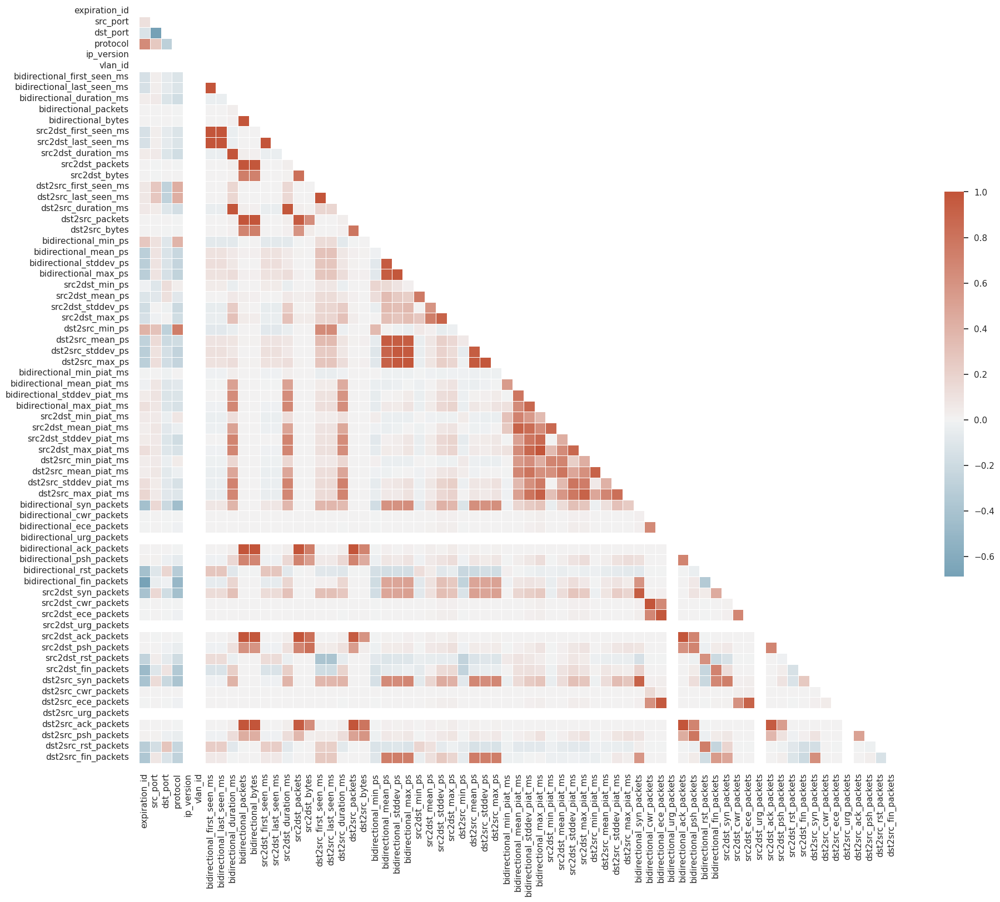

In [4]:
show_corr_matrix(ds)

In [5]:
compute_ratio(ds,'label')

                            Ratio
label                            
BENIGN                      83.71
PortScan                     7.34
DoS Hulk                     5.03
DDoS                         3.03
FTP-Patator                  0.25
DoS GoldenEye                0.25
DoS slowloris                0.16
SSH-Patator                  0.09
DoS Slowhttptest             0.09
Bot                          0.02
Web Attack - Brute Force     0.00
Infiltration                 0.00
Web Attack - XSS             0.00
Web Attack - Sql Injection   0.00
Heartbleed                   0.00


In [6]:
ds.label.value_counts()

label
BENIGN                        2639806
PortScan                       231572
DoS Hulk                       158546
DDoS                            95685
FTP-Patator                      7963
DoS GoldenEye                    7917
DoS slowloris                    5192
SSH-Patator                      2980
DoS Slowhttptest                 2732
Bot                               738
Web Attack - Brute Force          151
Infiltration                       28
Web Attack - XSS                   27
Web Attack - Sql Injection         12
Heartbleed                         11
Name: count, dtype: int64

In [7]:
ds = ds.drop(columns=['expiration_id','src_ip','src_mac','src_oui','src_port','dst_ip','dst_mac','dst_oui','dst_port','ip_version','vlan_id'])

In [8]:
sample_weights = ds.label.value_counts().to_dict()

In [9]:
sample_weights['BENIGN'] = 738
sample_weights['PortScan'] = 738
sample_weights['DoS Hulk'] = 738
sample_weights['DDoS'] = 738
sample_weights['FTP-Patator'] = 738
sample_weights['DoS GoldenEye'] = 738
sample_weights['DoS slowloris'] = 738
sample_weights['SSH-Patator'] = 738
sample_weights['DoS Slowhttptest'] = 738

In [54]:
params = {
    'iterations': 80,
    'depth': 9,
    'learning_rate': 0.1,
    'loss_function': 'MultiClass',
    'verbose': True
}

cat = CatBoostClassifier(**params)

rus = RandomUnderSampler(random_state=42, sampling_strategy=sample_weights)
X_res, y_res = rus.fit_resample(ds.drop(columns=['label']), ds['label'])

In [18]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size = 0.2, random_state=12, shuffle=True, stratify=y_res)

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel

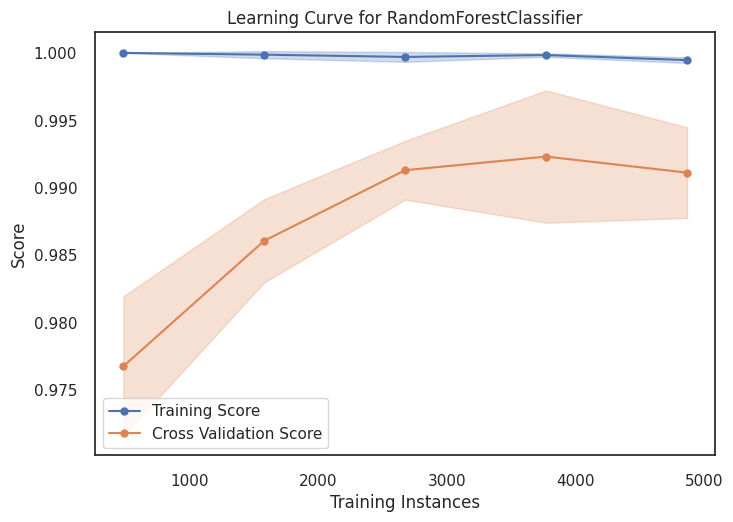

In [12]:
if True:
    cv = 5
    visualizer = LearningCurve(estimator=cat, cv=cv, scoring='f1_weighted', n_jobs=1, random_state=123)
    visualizer.fit(X_train, y_train)
    visualizer.show(outpath="cat_data/learning_curve.png")


![Alt text](cat_data/learning_curve.png)

In [19]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
skf.get_n_splits(X_res, y_res)

5

In [55]:
avg_train_f1 = []
avg_test_f1 = []

for i, (train_index, test_index) in enumerate(skf.split(X_res, y_res)):
    print(f"Fold {i}:")
    cat.fit(X_res.iloc[train_index], y_res.iloc[train_index])
    y_predicted_train = cat.predict(X_res.iloc[train_index])
    y_predicted_test = cat.predict(X_res.iloc[test_index])
    train_f1 = metrics.f1_score(y_res.iloc[train_index], y_predicted_train, average='weighted')
    test_f1 = metrics.f1_score(y_res.iloc[test_index], y_predicted_test, average='weighted')
    print(f"Train F1: {train_f1:.4f}")
    print(f"Test F1: {test_f1:.4f}")
    avg_train_f1.append(train_f1)
    avg_test_f1.append(test_f1)

print(f"Average Train F1: {np.mean(avg_train_f1):.4f}")
print(f"Average Test F1: {np.mean(avg_test_f1):.4f}")

Fold 0:
0:	learn: 1.7930388	total: 182ms	remaining: 14.4s
1:	learn: 1.4251304	total: 406ms	remaining: 15.8s
2:	learn: 1.1860448	total: 657ms	remaining: 16.9s
3:	learn: 1.0168495	total: 929ms	remaining: 17.6s
4:	learn: 0.8803596	total: 1.25s	remaining: 18.8s
5:	learn: 0.7732741	total: 1.57s	remaining: 19.4s
6:	learn: 0.6870529	total: 1.92s	remaining: 20s
7:	learn: 0.6142555	total: 2.25s	remaining: 20.3s
8:	learn: 0.5513066	total: 2.61s	remaining: 20.6s
9:	learn: 0.4960390	total: 2.93s	remaining: 20.5s
10:	learn: 0.4495256	total: 3.26s	remaining: 20.5s
11:	learn: 0.4077313	total: 3.6s	remaining: 20.4s
12:	learn: 0.3717173	total: 3.92s	remaining: 20.2s
13:	learn: 0.3400654	total: 4.28s	remaining: 20.2s
14:	learn: 0.3092668	total: 4.65s	remaining: 20.2s
15:	learn: 0.2849591	total: 5s	remaining: 20s
16:	learn: 0.2624519	total: 5.33s	remaining: 19.7s
17:	learn: 0.2431664	total: 5.65s	remaining: 19.5s
18:	learn: 0.2248177	total: 5.97s	remaining: 19.2s
19:	learn: 0.2086209	total: 6.29s	remaini

In [56]:
%time cat.fit(X_train, y_train)

0:	learn: 1.7578387	total: 207ms	remaining: 16.4s
1:	learn: 1.4106715	total: 395ms	remaining: 15.4s
2:	learn: 1.1730247	total: 576ms	remaining: 14.8s
3:	learn: 1.0037254	total: 754ms	remaining: 14.3s
4:	learn: 0.8719448	total: 944ms	remaining: 14.2s
5:	learn: 0.7664450	total: 1.13s	remaining: 13.9s
6:	learn: 0.6840844	total: 1.31s	remaining: 13.7s
7:	learn: 0.6125980	total: 1.54s	remaining: 13.9s
8:	learn: 0.5487342	total: 1.81s	remaining: 14.3s
9:	learn: 0.4942488	total: 2.1s	remaining: 14.7s
10:	learn: 0.4467124	total: 2.43s	remaining: 15.3s
11:	learn: 0.4044537	total: 2.8s	remaining: 15.9s
12:	learn: 0.3688561	total: 3.18s	remaining: 16.4s
13:	learn: 0.3369753	total: 3.55s	remaining: 16.7s
14:	learn: 0.3082070	total: 3.98s	remaining: 17.3s
15:	learn: 0.2839061	total: 4.36s	remaining: 17.4s
16:	learn: 0.2613027	total: 4.75s	remaining: 17.6s
17:	learn: 0.2412463	total: 5.13s	remaining: 17.7s
18:	learn: 0.2228871	total: 5.5s	remaining: 17.7s
19:	learn: 0.2065297	total: 5.88s	remaining:

In [57]:
%time y_predicted_train = cat.predict(X_train)
%time y_predicted_test = cat.predict(X_test)

CPU times: user 13.7 ms, sys: 1.89 ms, total: 15.6 ms
Wall time: 5.4 ms
CPU times: user 7.37 ms, sys: 37 µs, total: 7.4 ms
Wall time: 5.39 ms


In [58]:
performanceMetricsDFWeighted(metrics, y_train, y_predicted_train, y_test, y_predicted_test, 'weighted')

,Measure,Train,Test
0,ACCURACY,0.997864,0.994744
1,PRECISION,0.997867,0.994834
2,RECALL,0.997864,0.994744
3,F1 SCORE,0.997864,0.994725


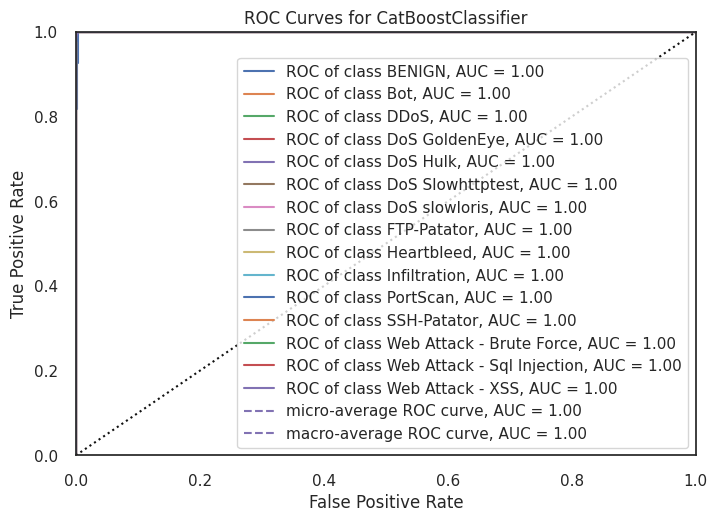

<Axes: title={'center': 'ROC Curves for CatBoostClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [59]:
model = wrap(cat)
visualizer = ROCAUC(model)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

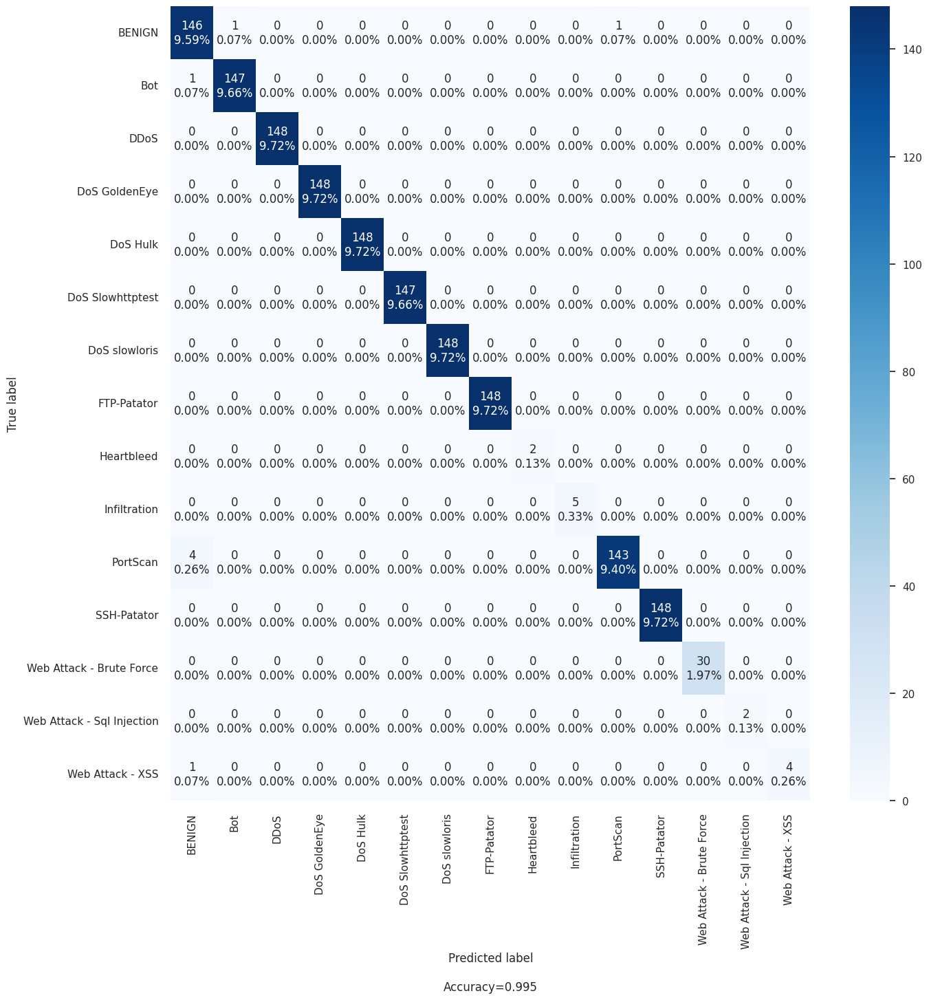

In [60]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(cat.classes_)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

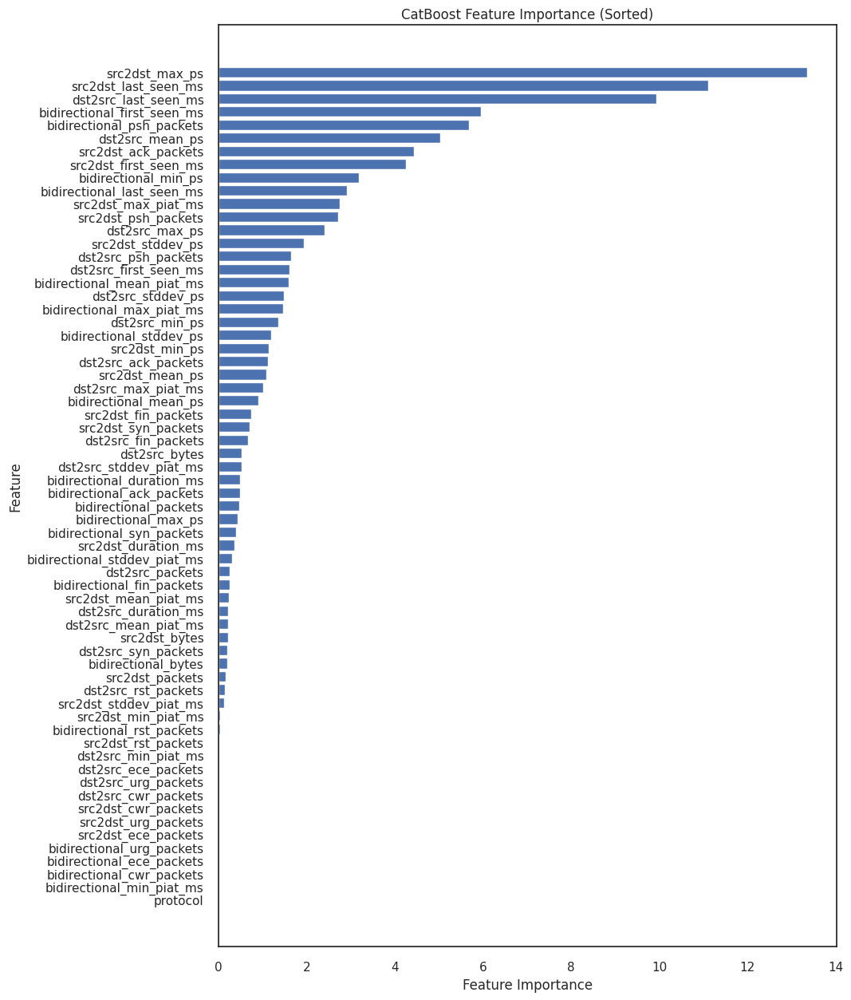

In [65]:
# Retrieve feature importance
feature_importance = model.get_feature_importance(type="FeatureImportance")
feature_names = X_train.columns

# Sort the features and feature importance scores
sorted_indices = np.argsort(feature_importance)
sorted_feature_importance = feature_importance[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

# Plot the sorted feature importance
plt.figure(figsize=(10, 15))
plt.barh(sorted_feature_names, sorted_feature_importance)
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('CatBoost Feature Importance (Sorted)')
plt.show()

Using interventional to stay "true to the model" since we will use this data to do feature reduction and we want also to understand how things work

In [66]:
%%time

explainer = fasttreeshap.TreeExplainer(cat, algorithm='auto', n_jobs=-1) 
sv = explainer(X_train)

CPU times: user 54.6 s, sys: 312 ms, total: 54.9 s
Wall time: 6.32 s


In [67]:
cat.classes_

array(['BENIGN', 'Bot', 'DDoS', 'DoS GoldenEye', 'DoS Hulk',
       'DoS Slowhttptest', 'DoS slowloris', 'FTP-Patator', 'Heartbleed',
       'Infiltration', 'PortScan', 'SSH-Patator',
       'Web Attack - Brute Force', 'Web Attack - Sql Injection',
       'Web Attack - XSS'], dtype=object)

## Benign shap

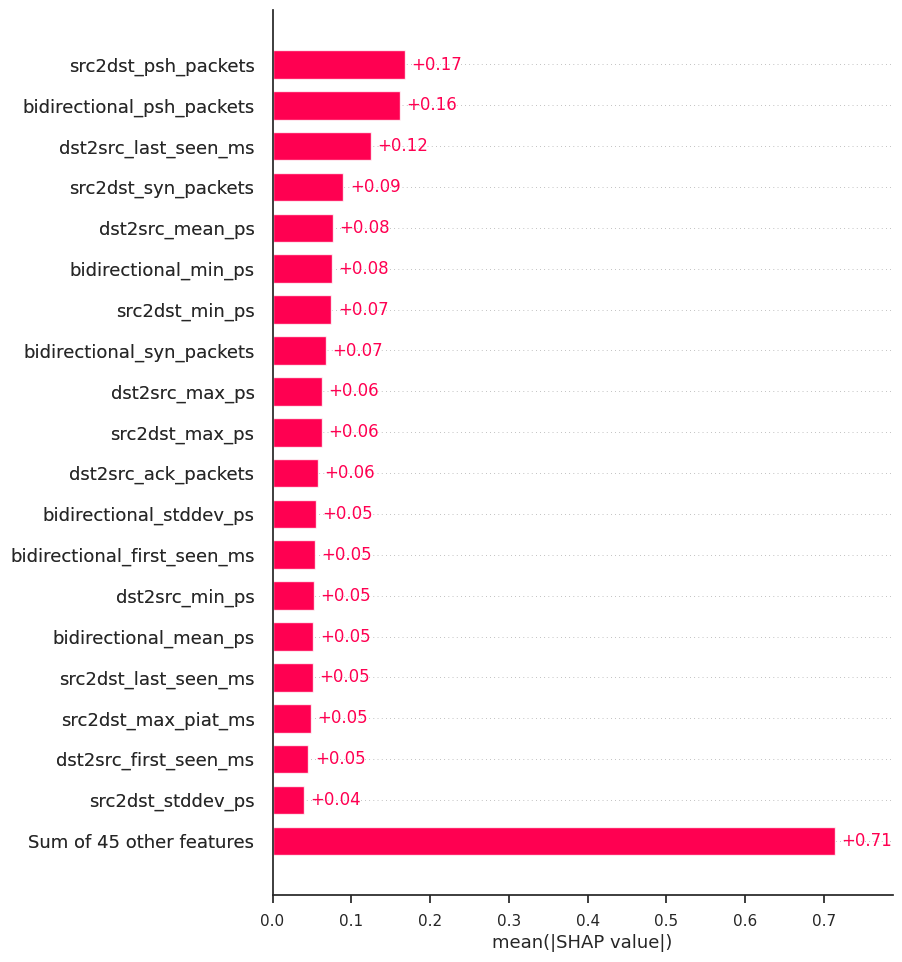

In [69]:
exp = Explanation(sv.values[:,:,0], 
                  sv.base_values[:,0], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

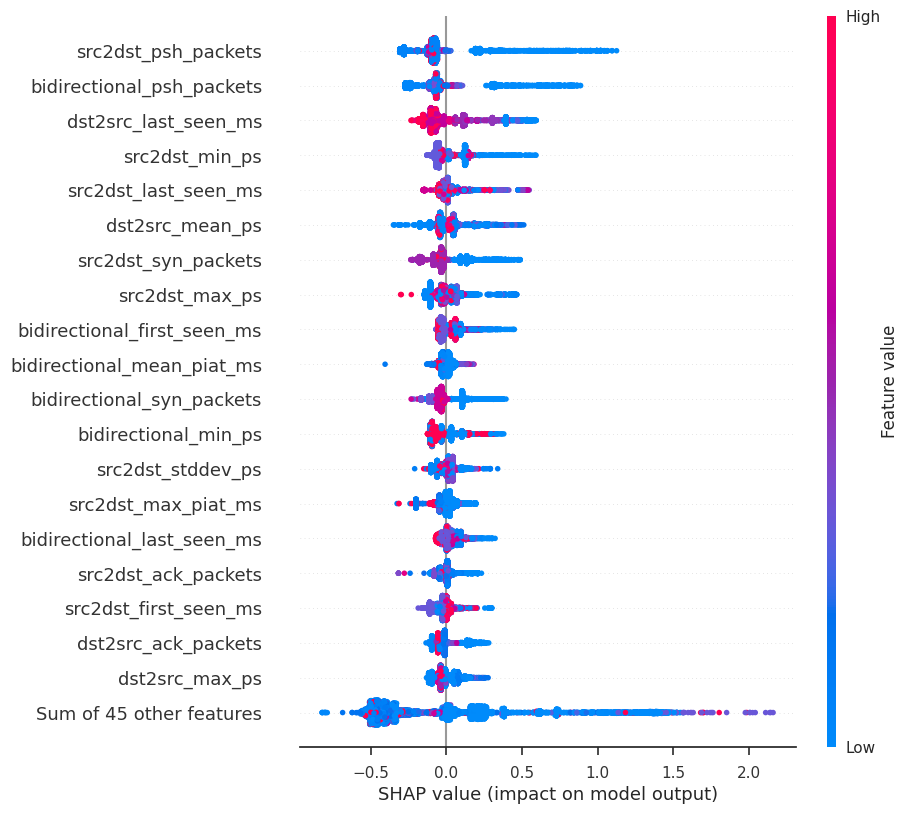

In [70]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

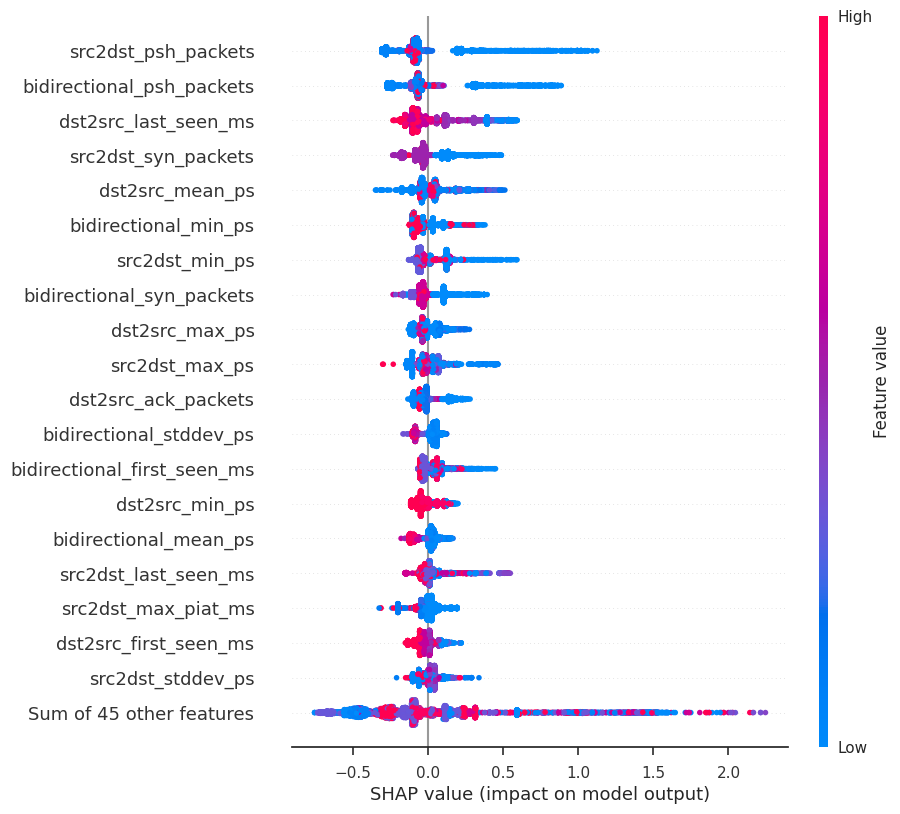

In [71]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Bot shap

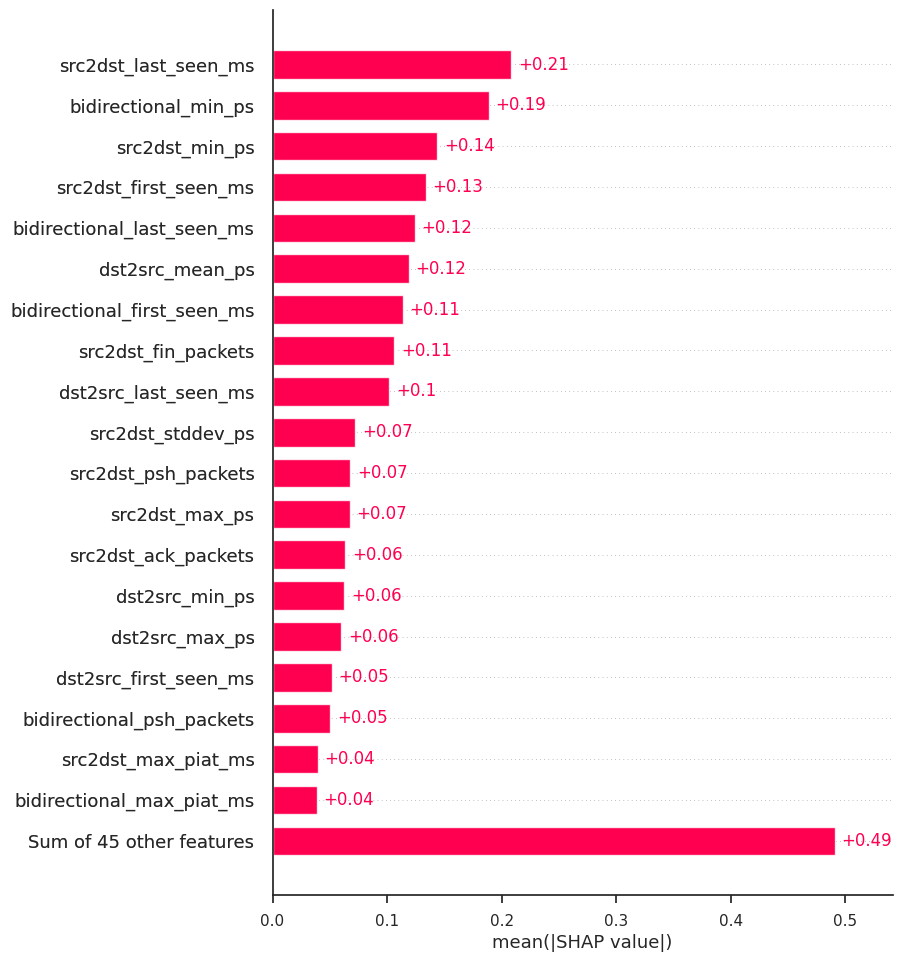

In [72]:
exp = Explanation(sv.values[:,:,1], 
                  sv.base_values[:,1], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)

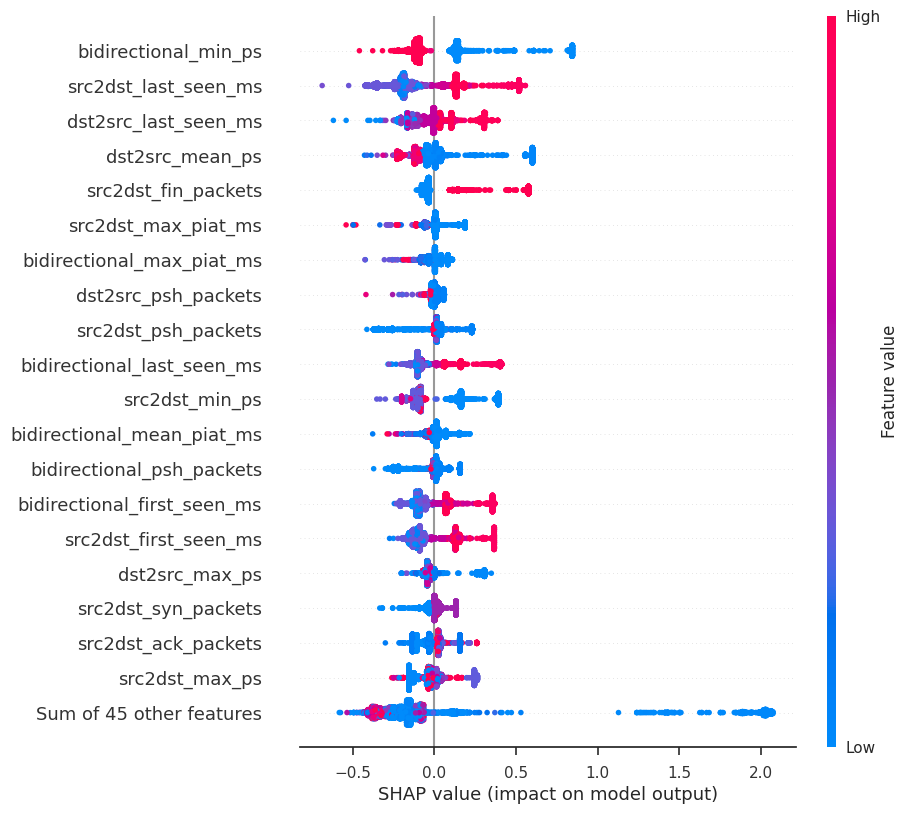

In [73]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

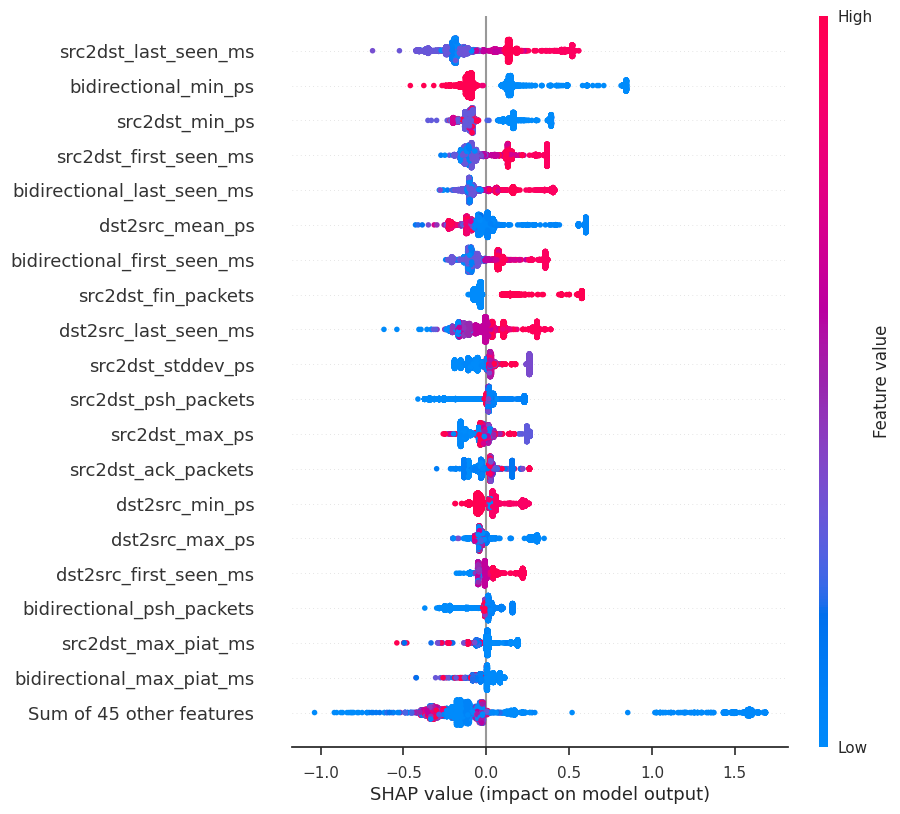

In [74]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DDoS shap

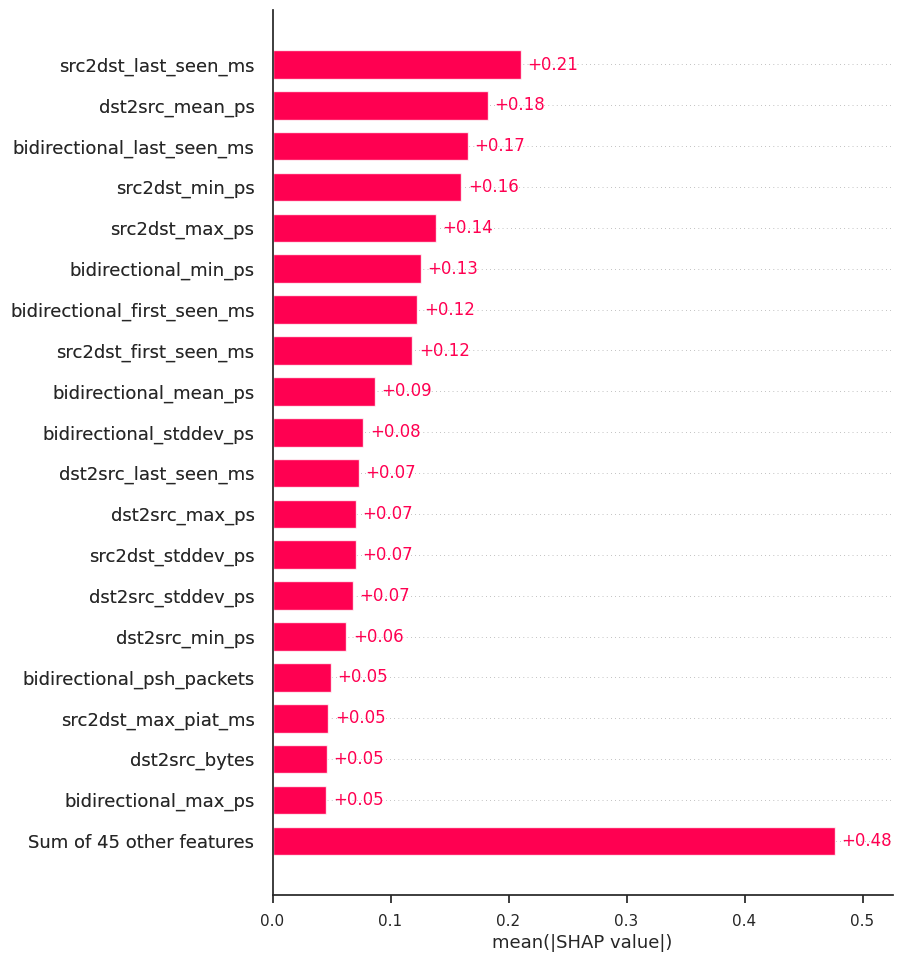

In [75]:
exp = Explanation(sv.values[:,:,2], 
                  sv.base_values[:,2], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)

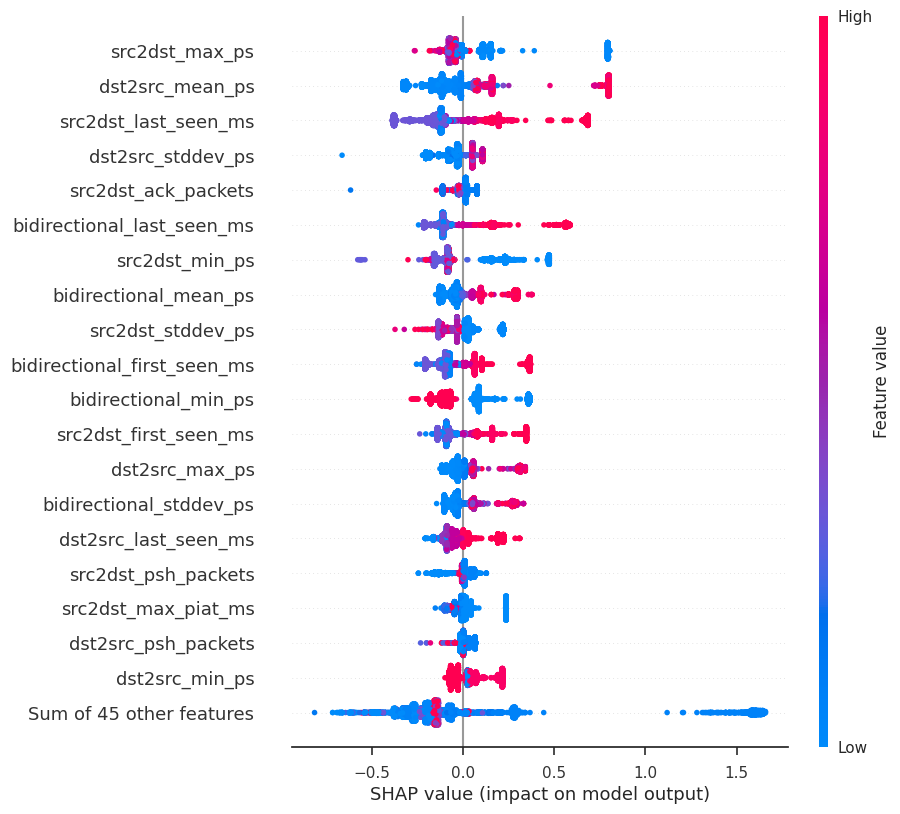

In [76]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

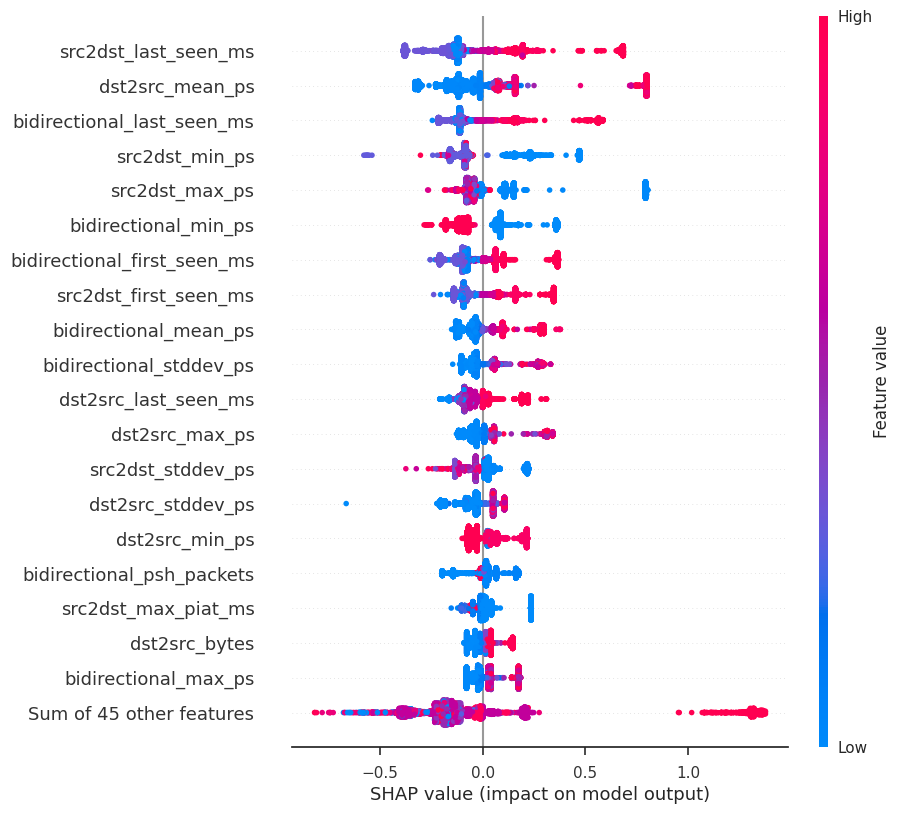

In [77]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS GoldenEye shap

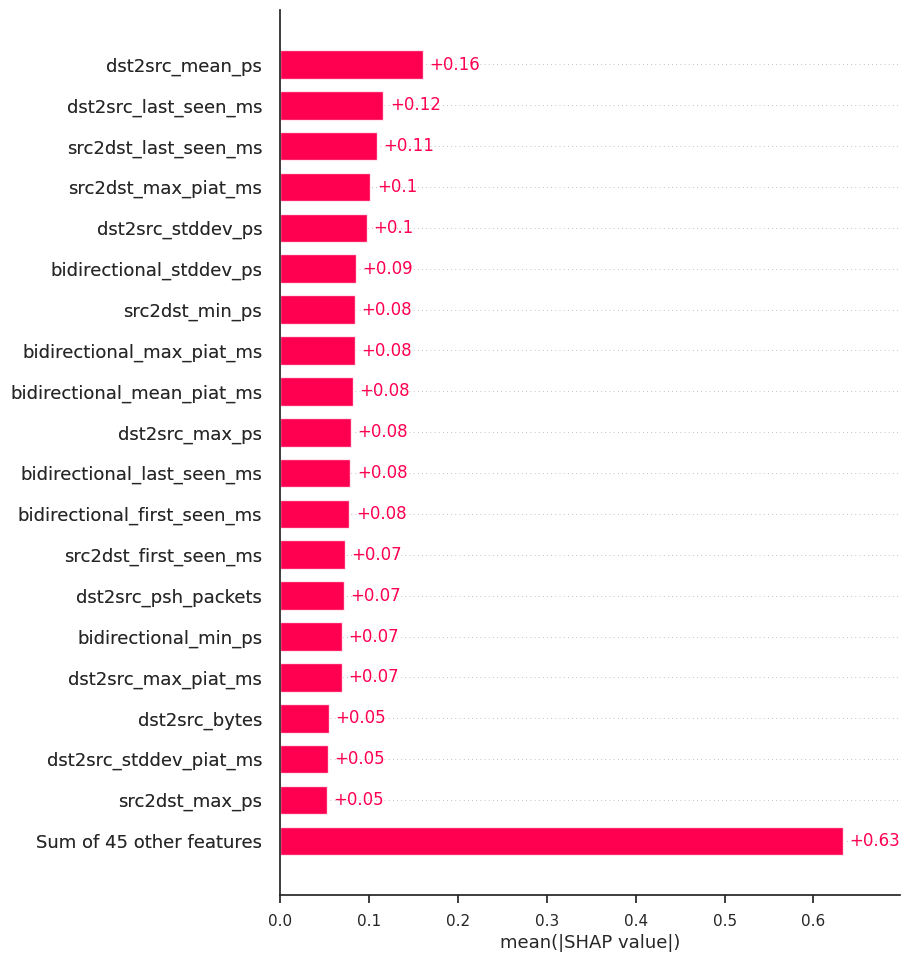

In [78]:
exp = Explanation(sv.values[:,:,3], 
                  sv.base_values[:,3], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

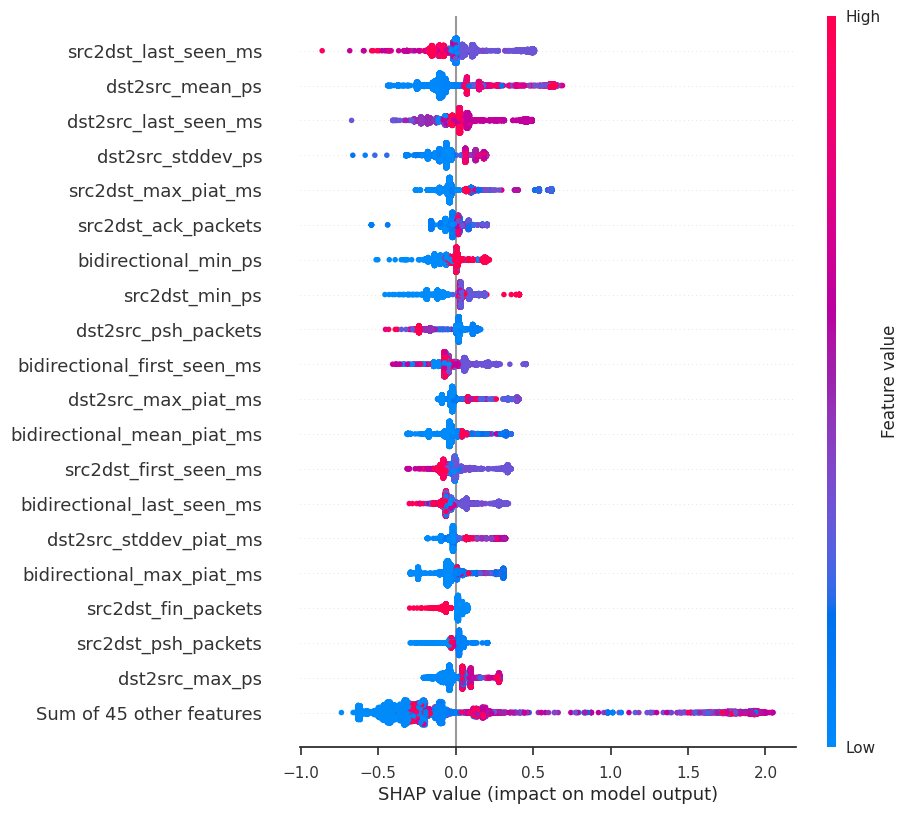

In [79]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

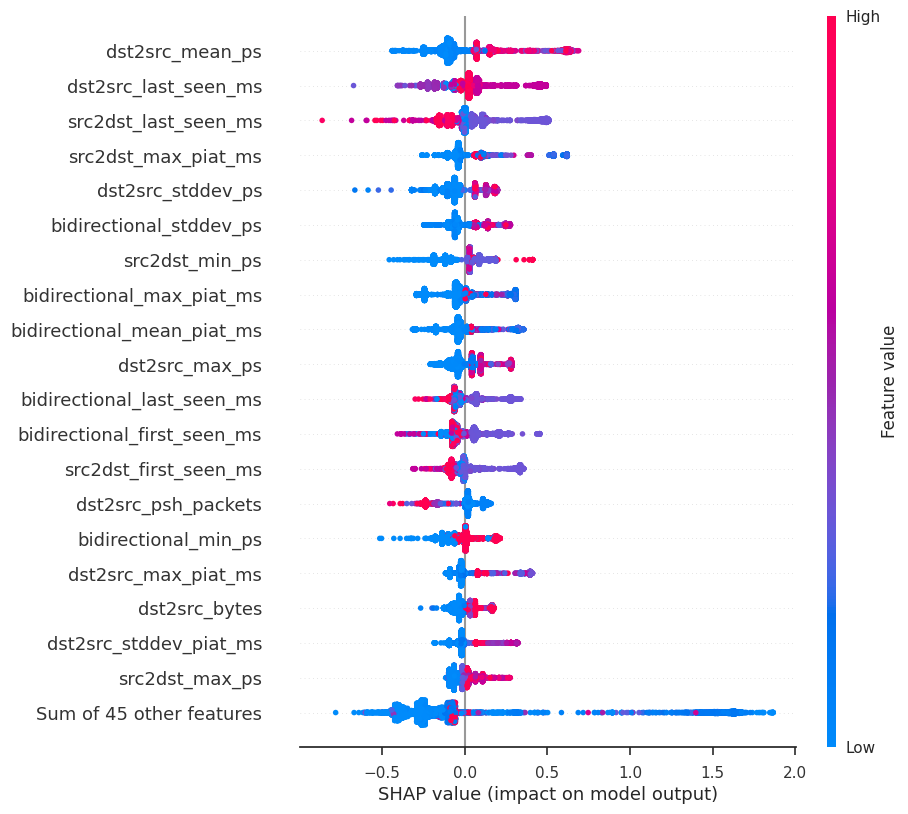

In [80]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS Hulk shap

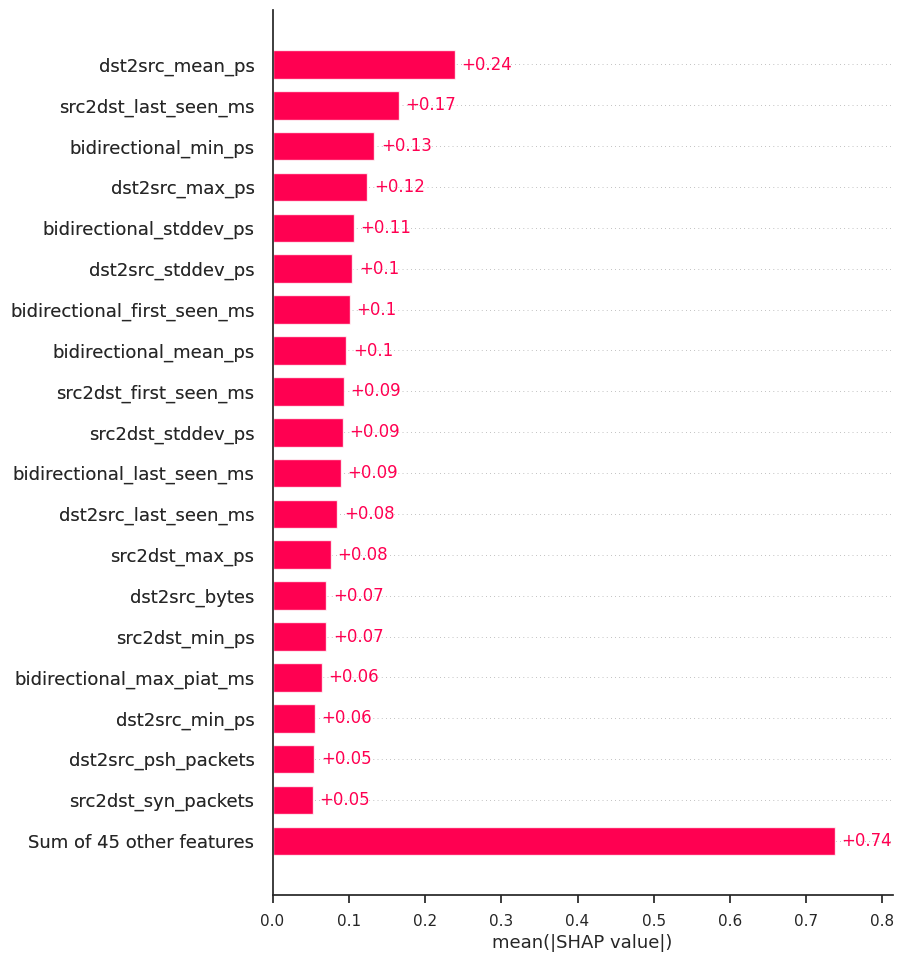

In [81]:
exp = Explanation(sv.values[:,:,4], 
                  sv.base_values[:,4], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

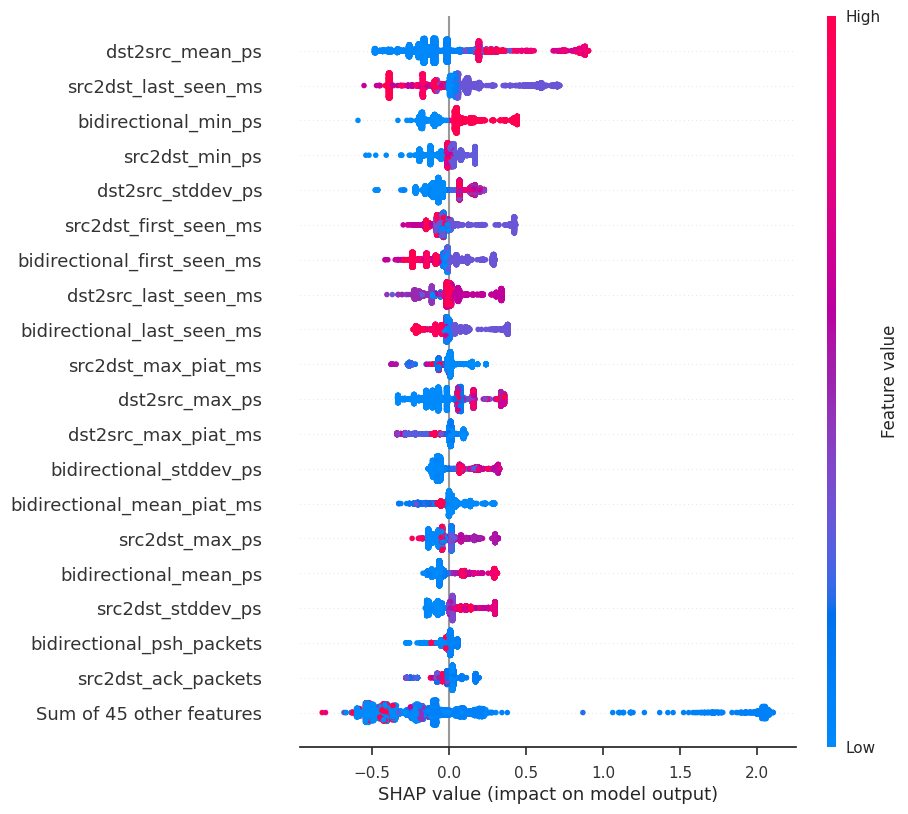

In [82]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

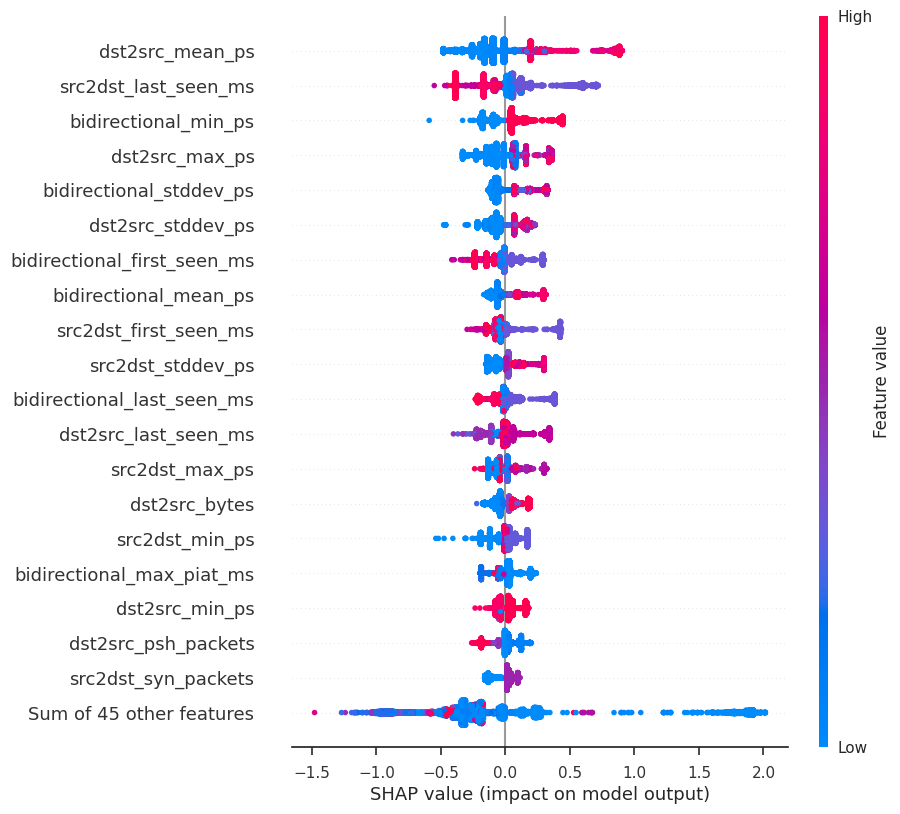

In [83]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS Slowhttptest shap

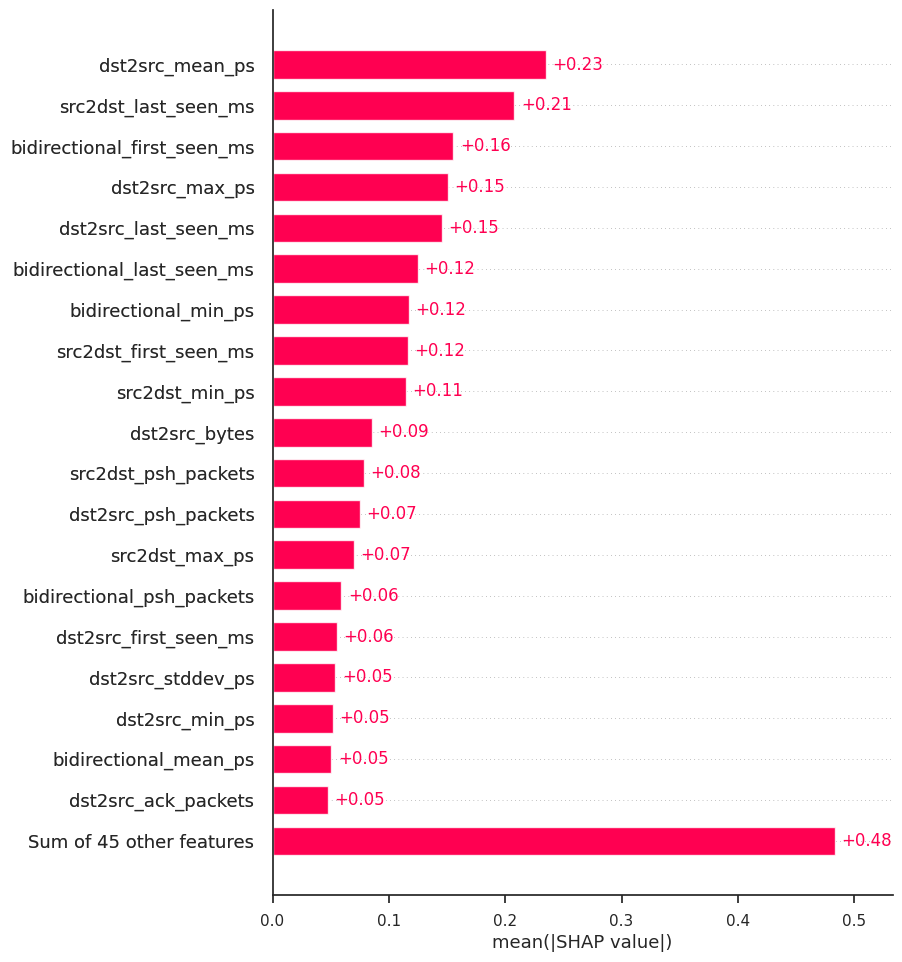

In [84]:
exp = Explanation(sv.values[:,:,5], 
                  sv.base_values[:,5], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

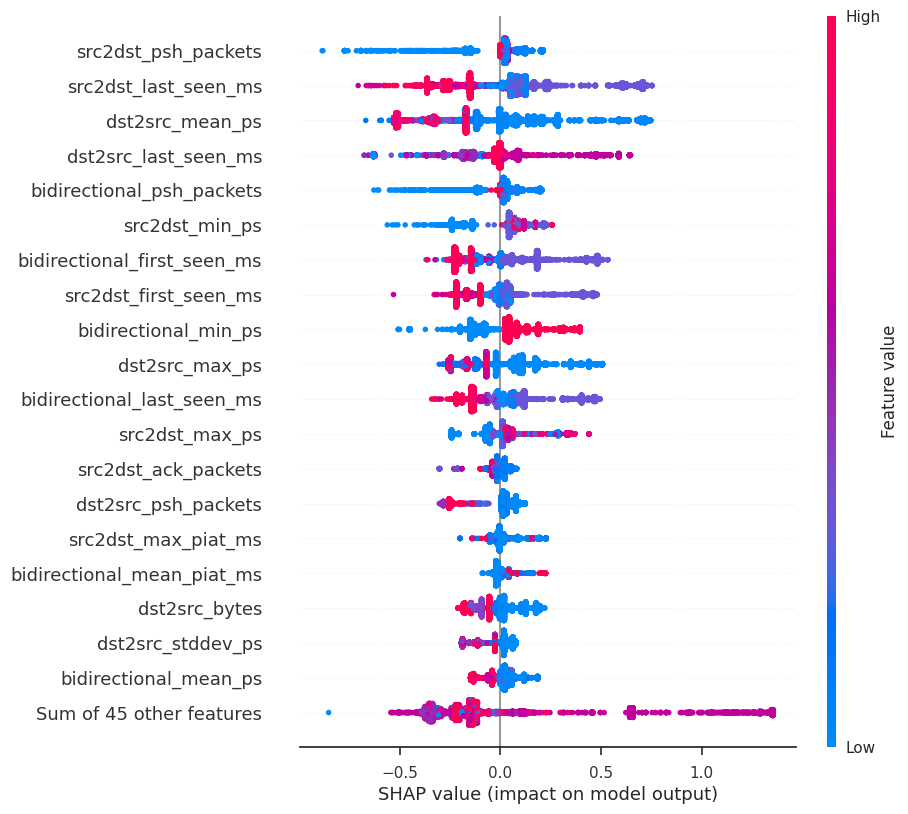

In [85]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

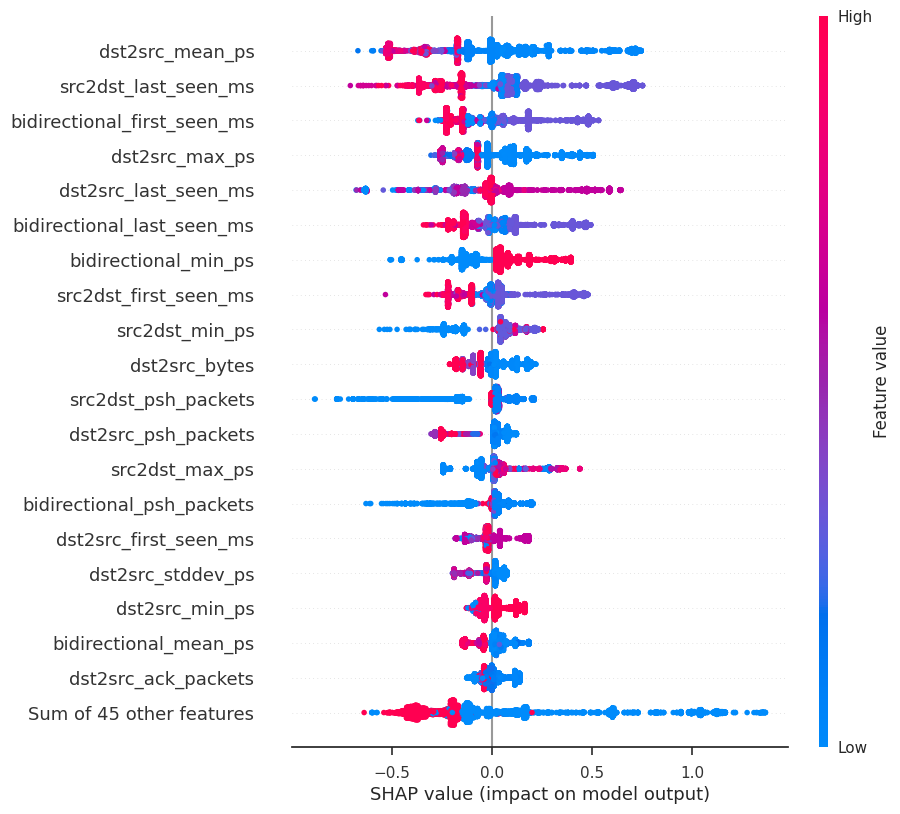

In [86]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS slowloris shap

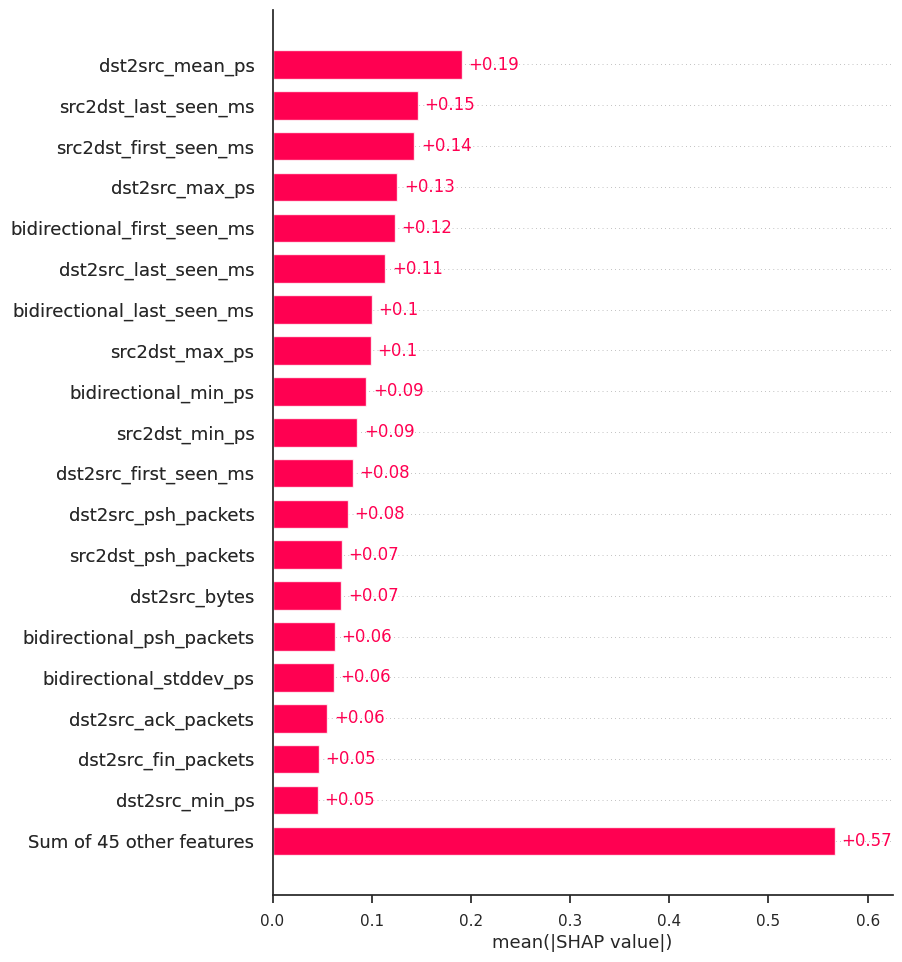

In [87]:
exp = Explanation(sv.values[:,:,6], 
                  sv.base_values[:,6], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

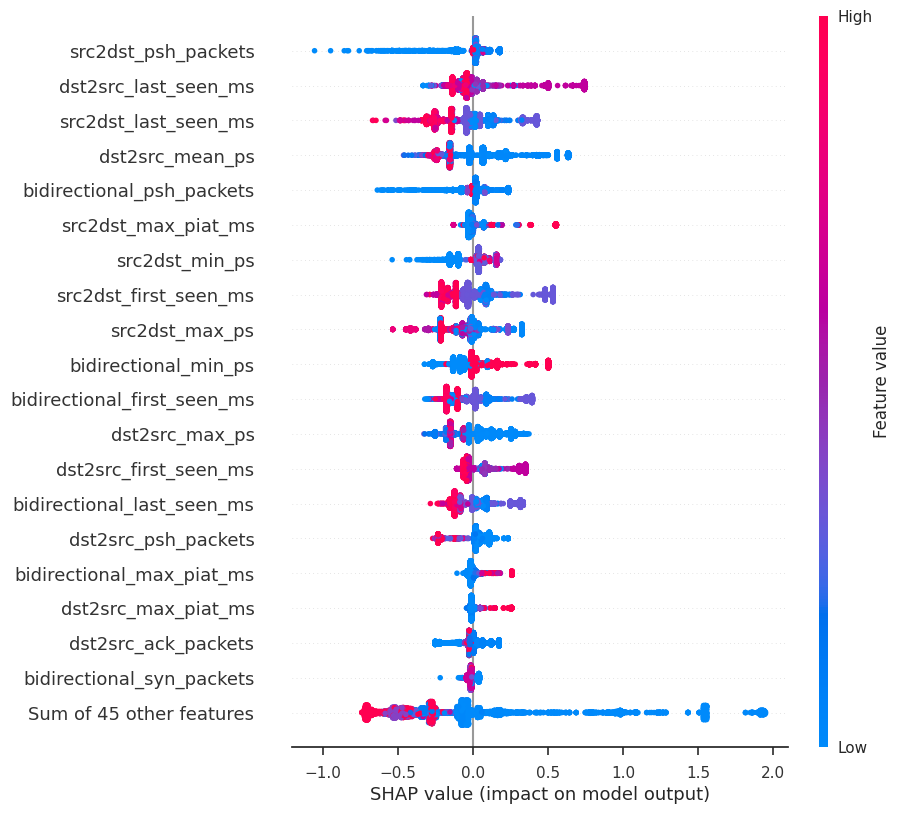

In [88]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

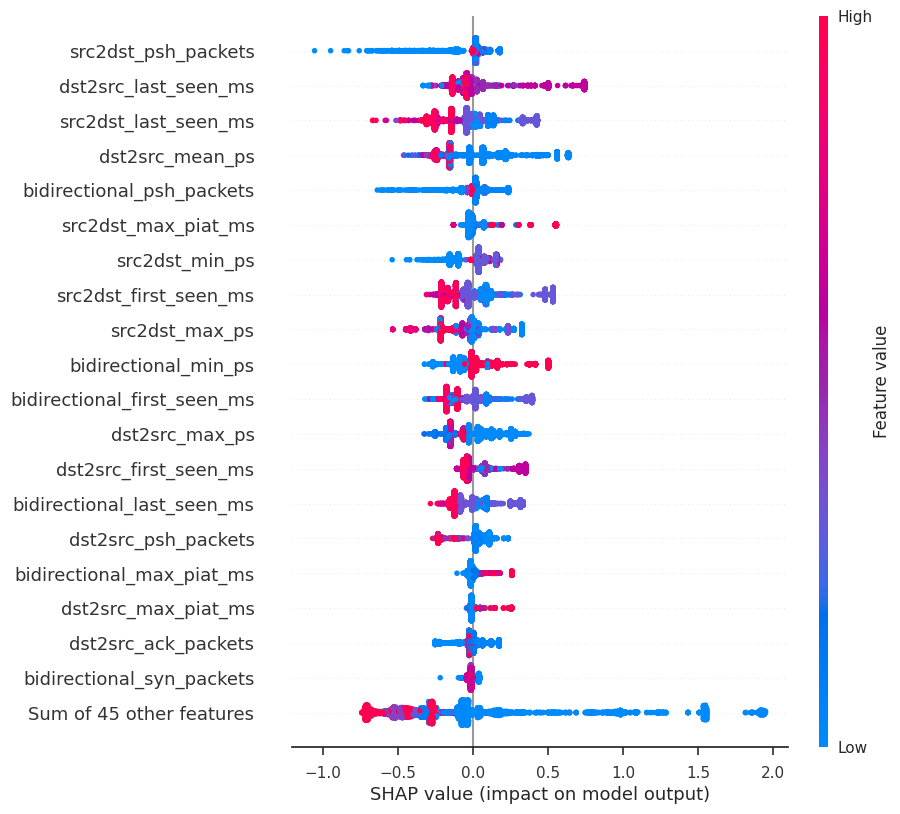

In [89]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

## FTP-Patator shap

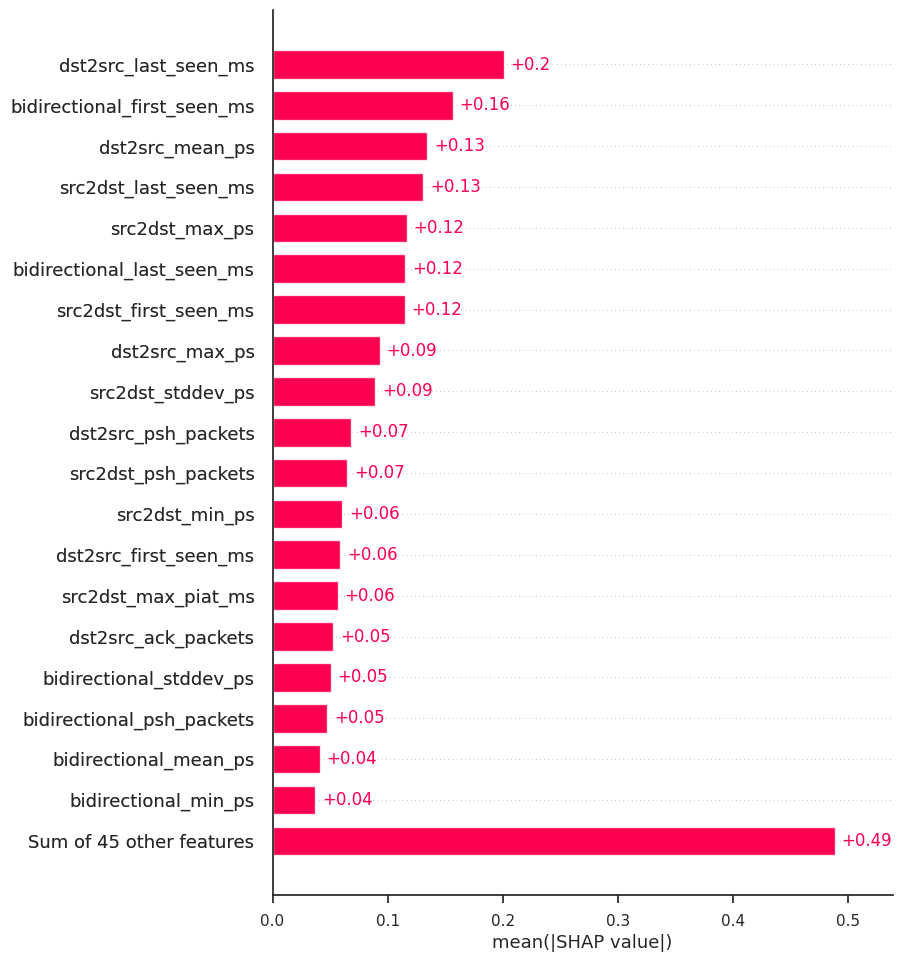

In [90]:
exp = Explanation(sv.values[:,:,7], 
                  sv.base_values[:,7], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

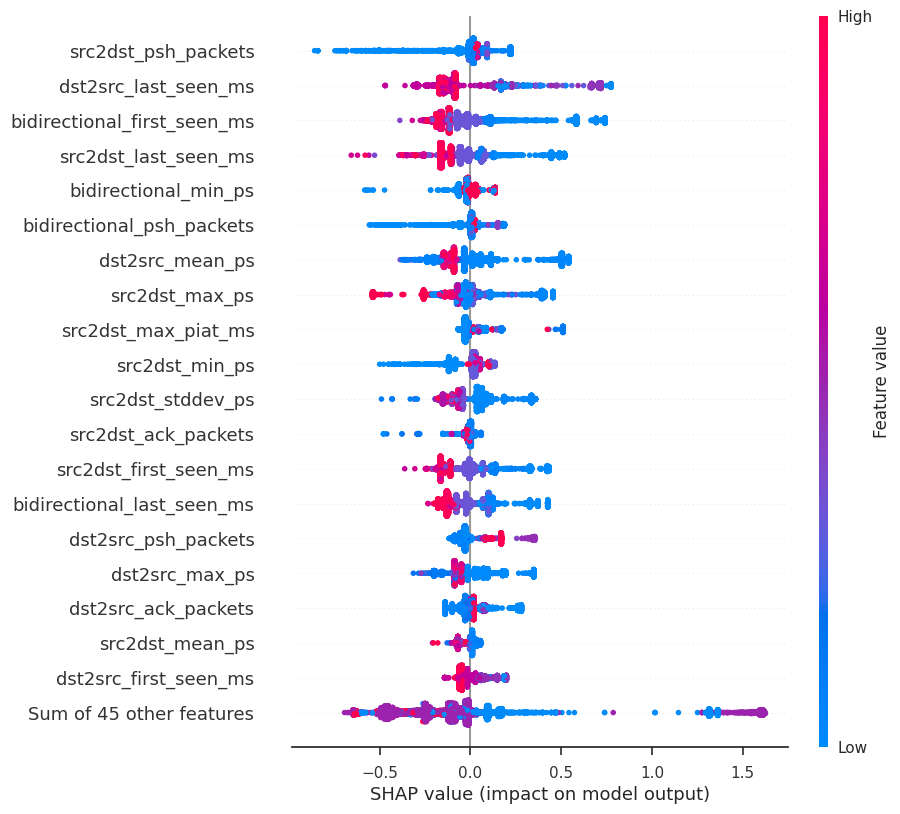

In [91]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

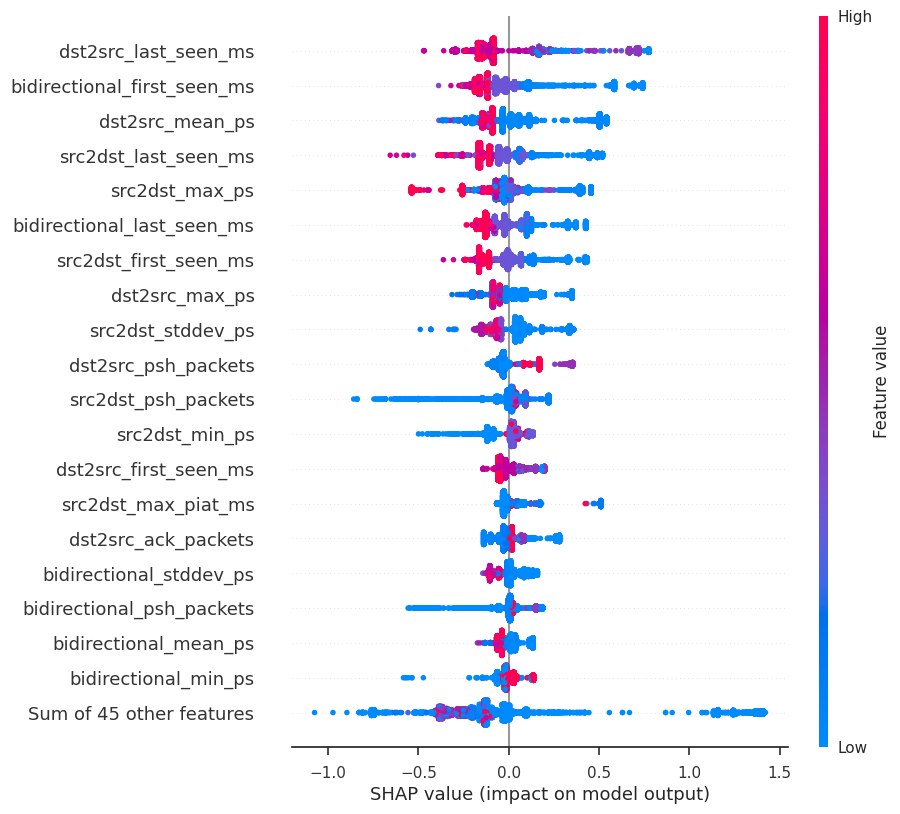

In [92]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Heartbleed shap

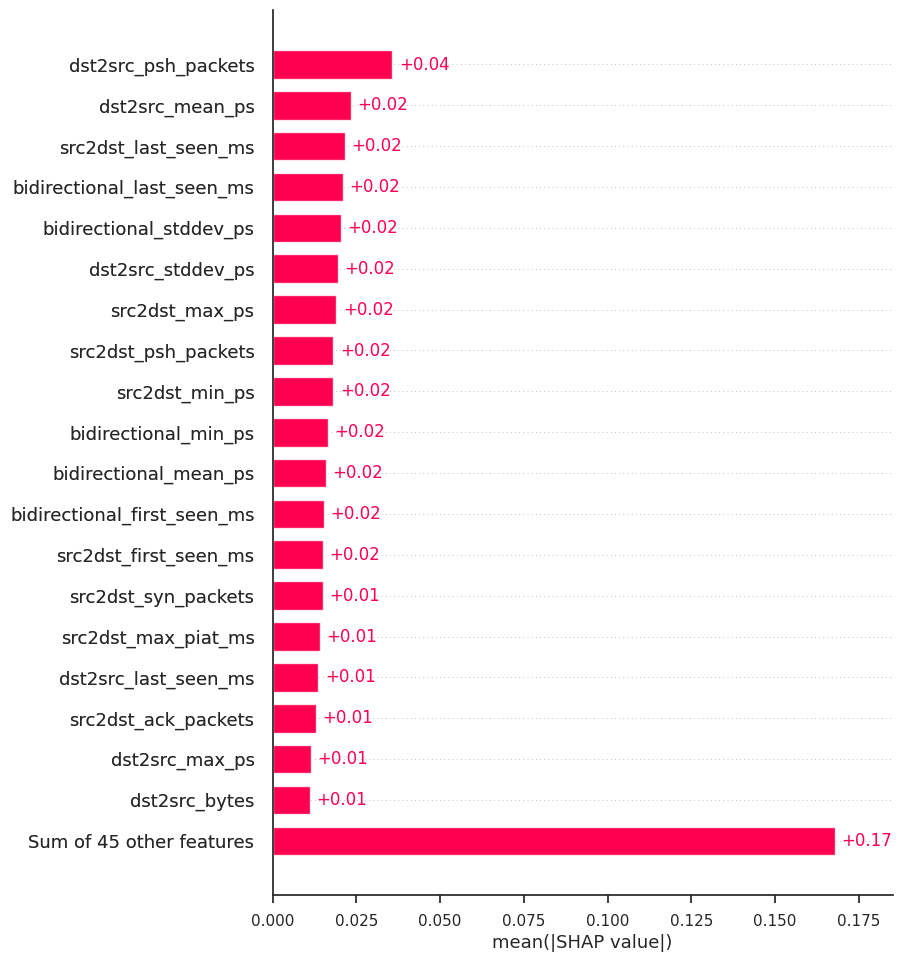

In [93]:
exp = Explanation(sv.values[:,:,8], 
                  sv.base_values[:,8], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

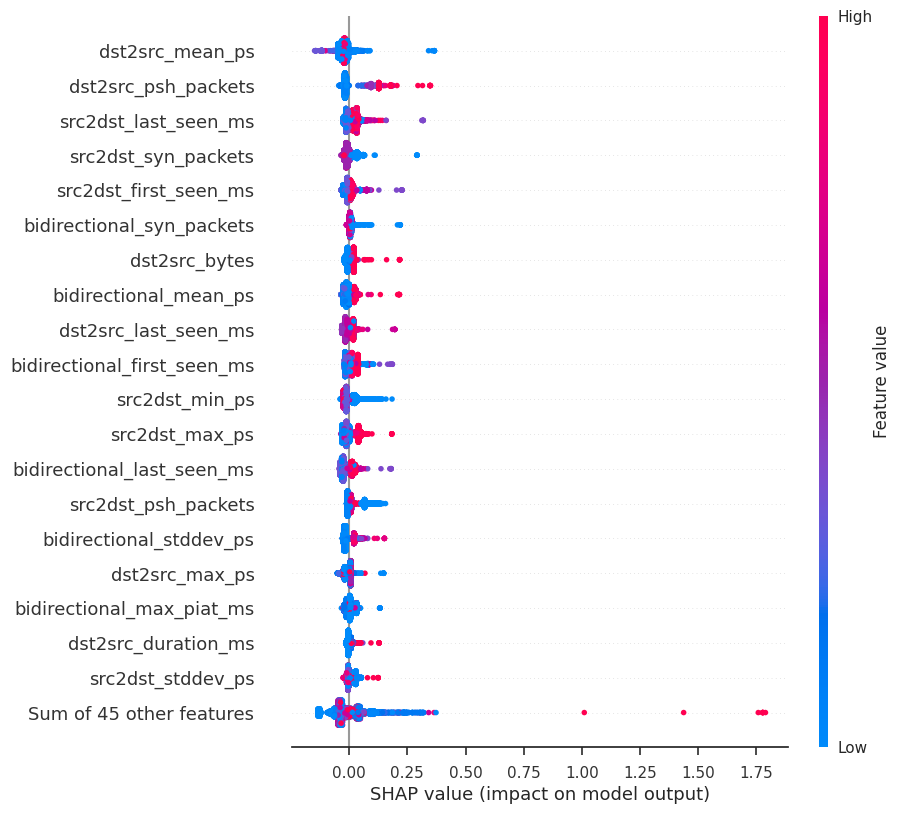

In [94]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

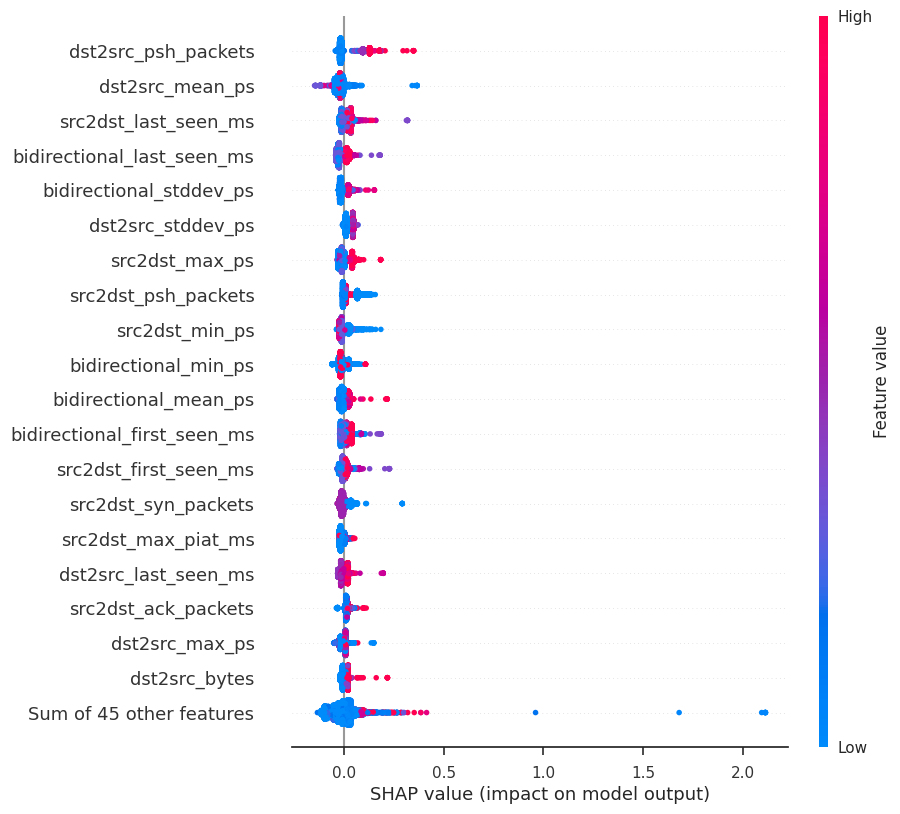

In [95]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Infiltration shap

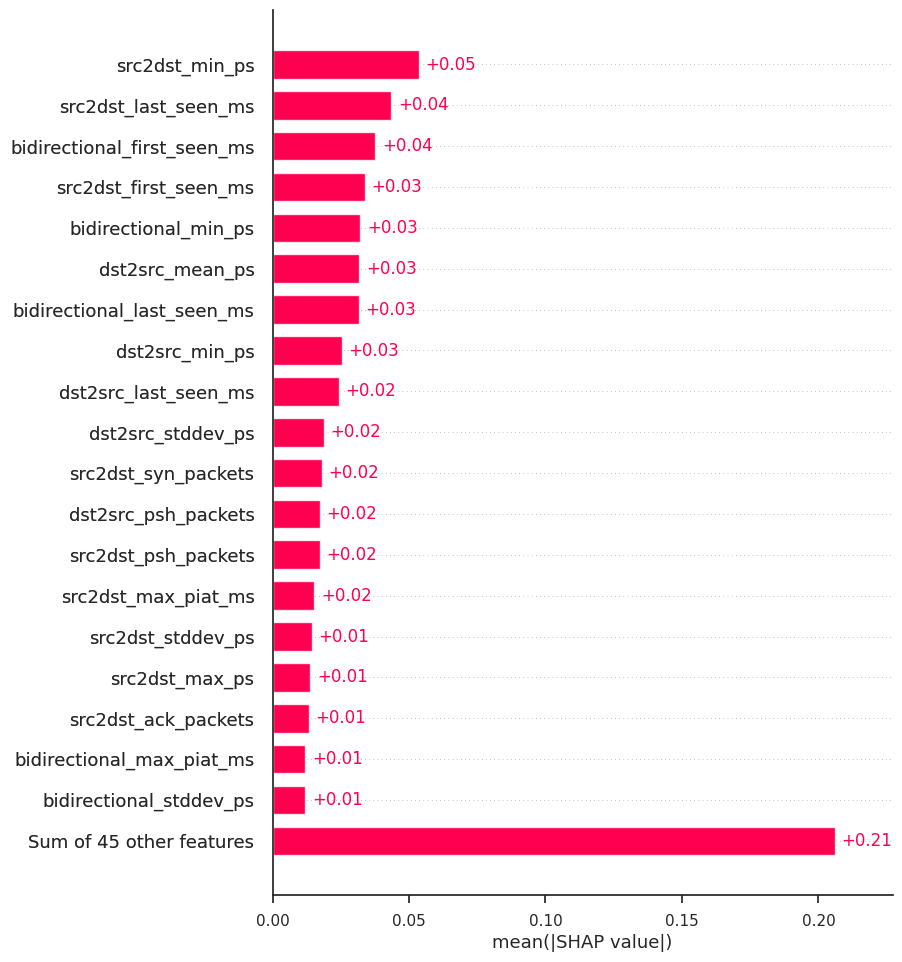

In [96]:
exp = Explanation(sv.values[:,:,9], 
                  sv.base_values[:,9], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

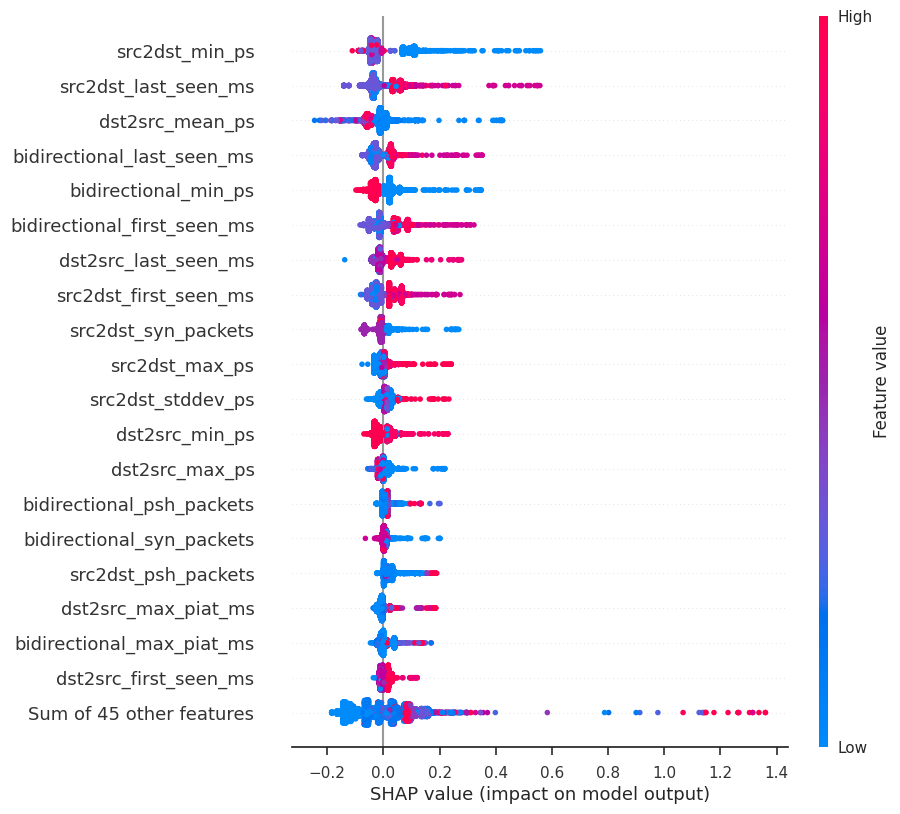

In [97]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

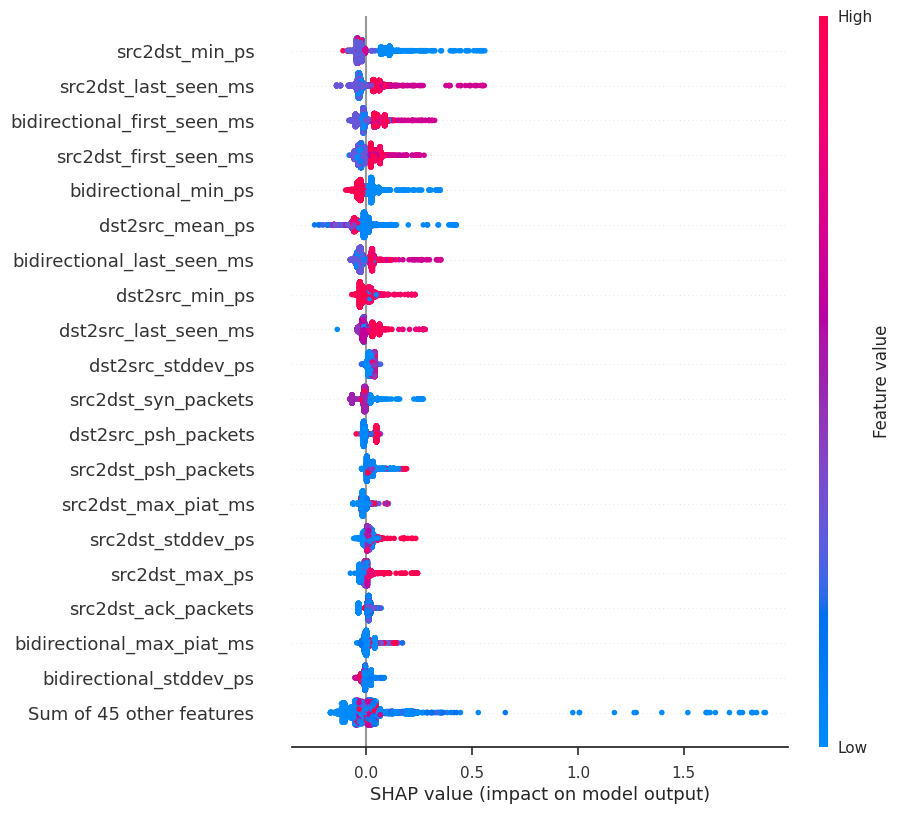

In [98]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## PortScan shap

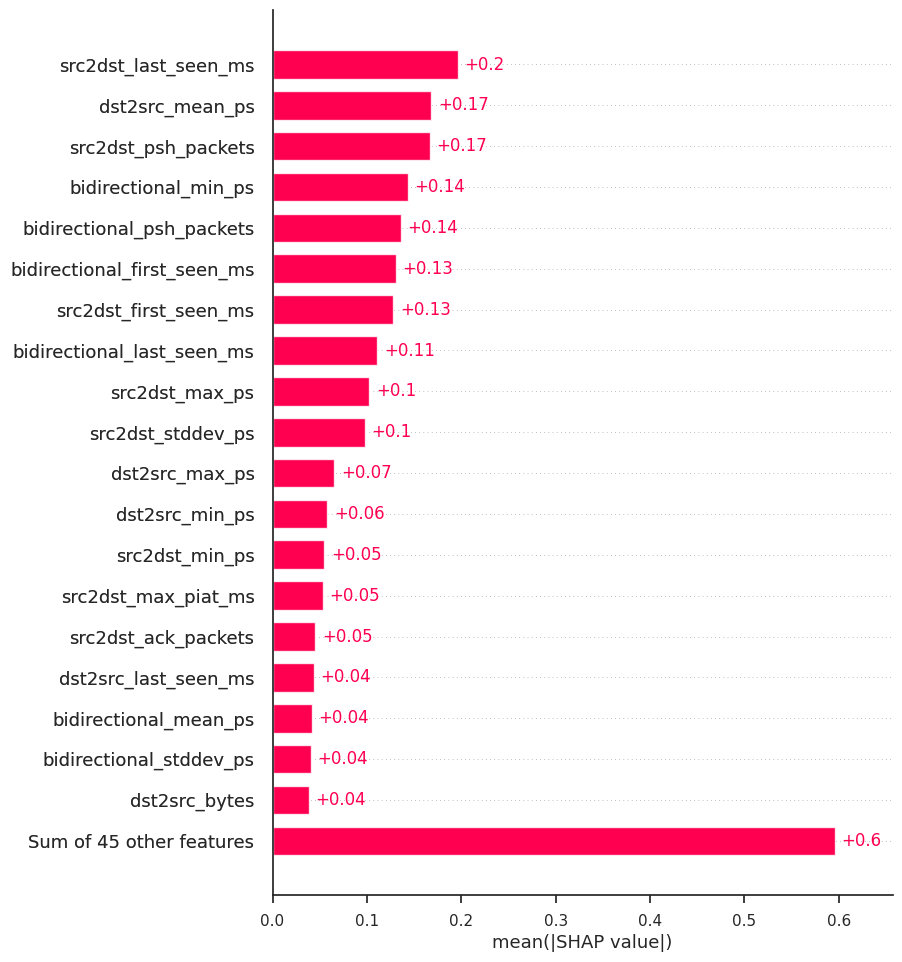

In [99]:
exp = Explanation(sv.values[:,:,10], 
                  sv.base_values[:,10], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

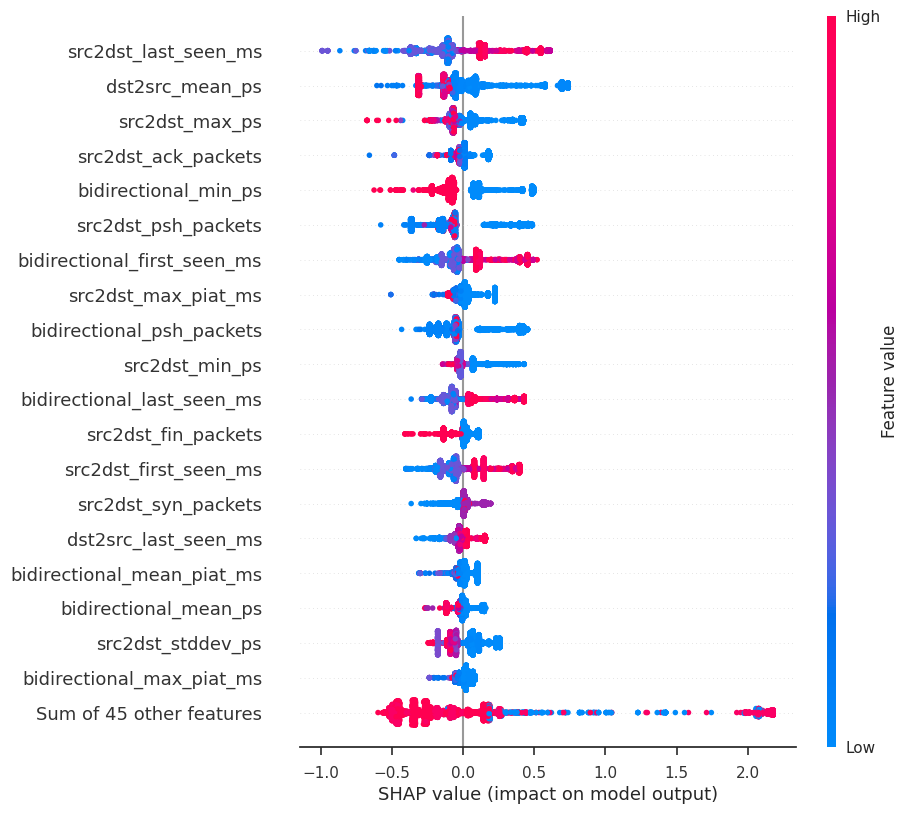

In [100]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

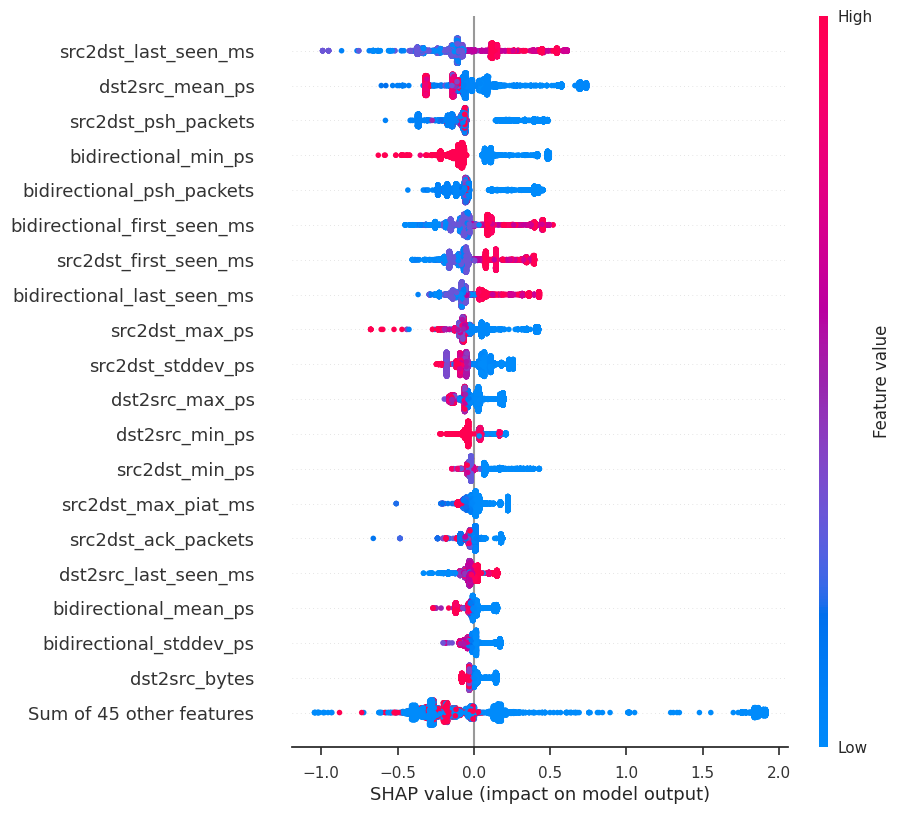

In [101]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## SSH-Patator shap

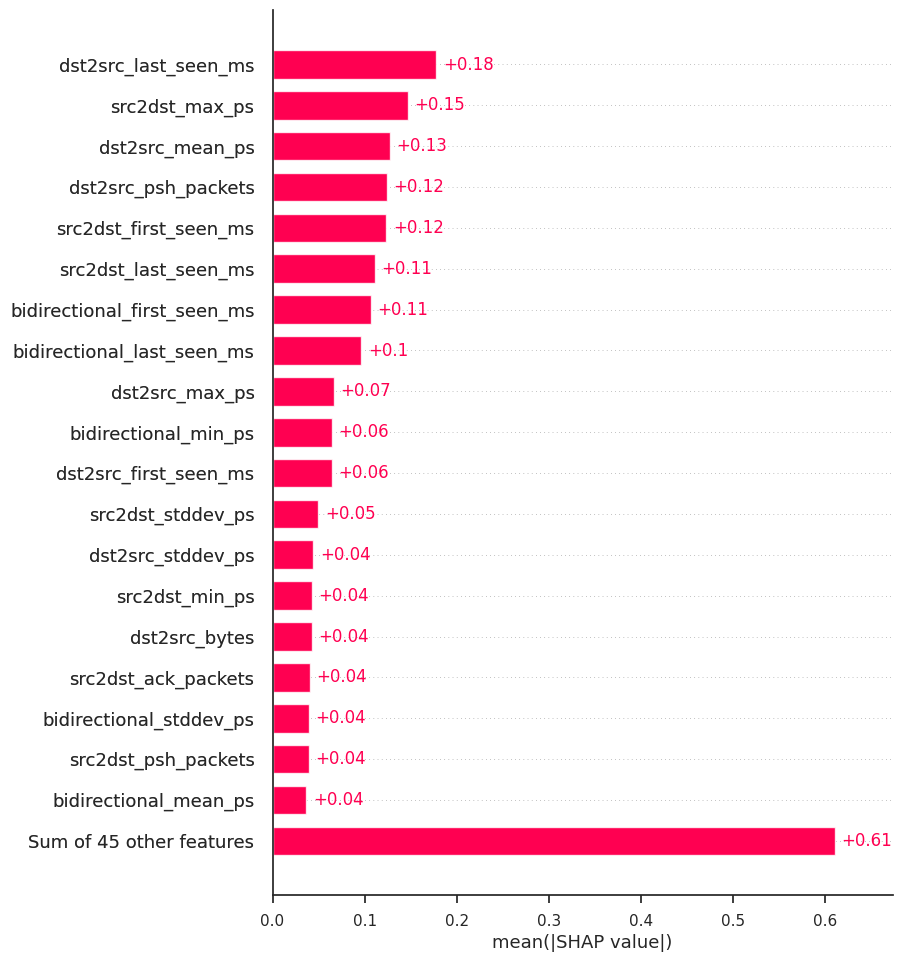

In [102]:
exp = Explanation(sv.values[:,:,11], 
                  sv.base_values[:,11], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

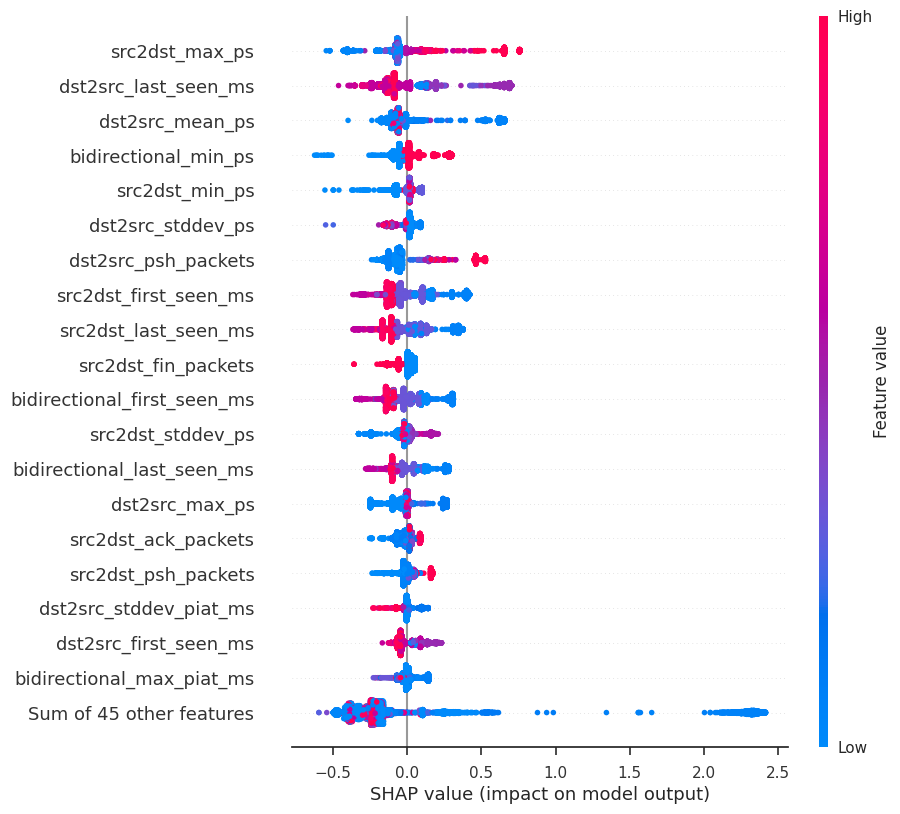

In [103]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

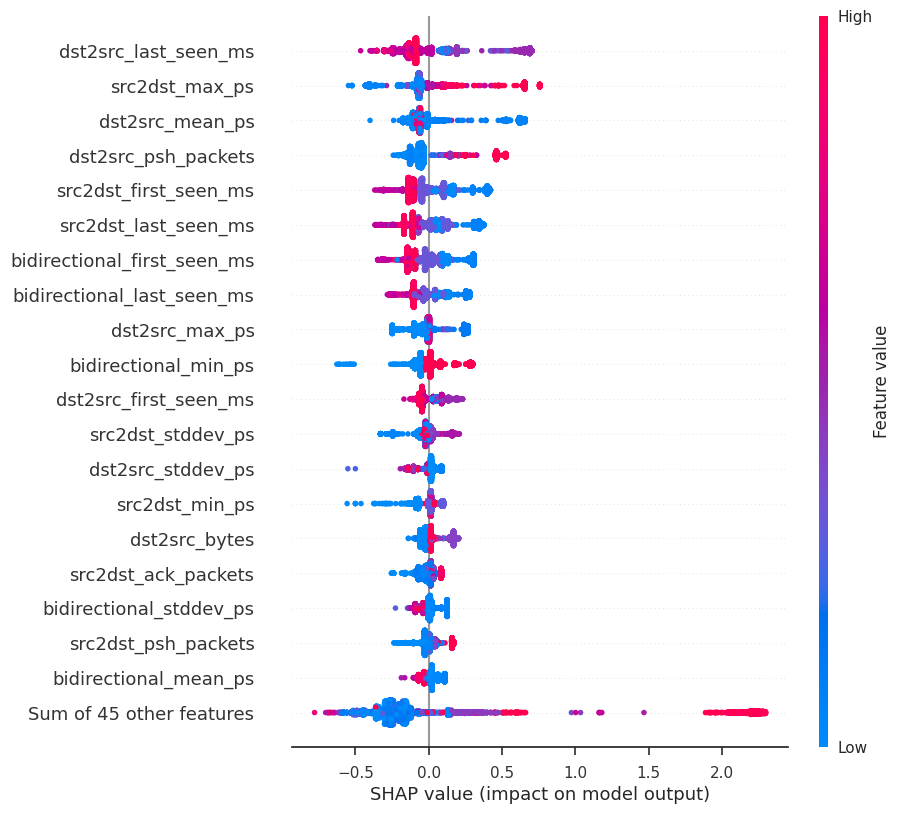

In [104]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Web Attack - Brute Force shap

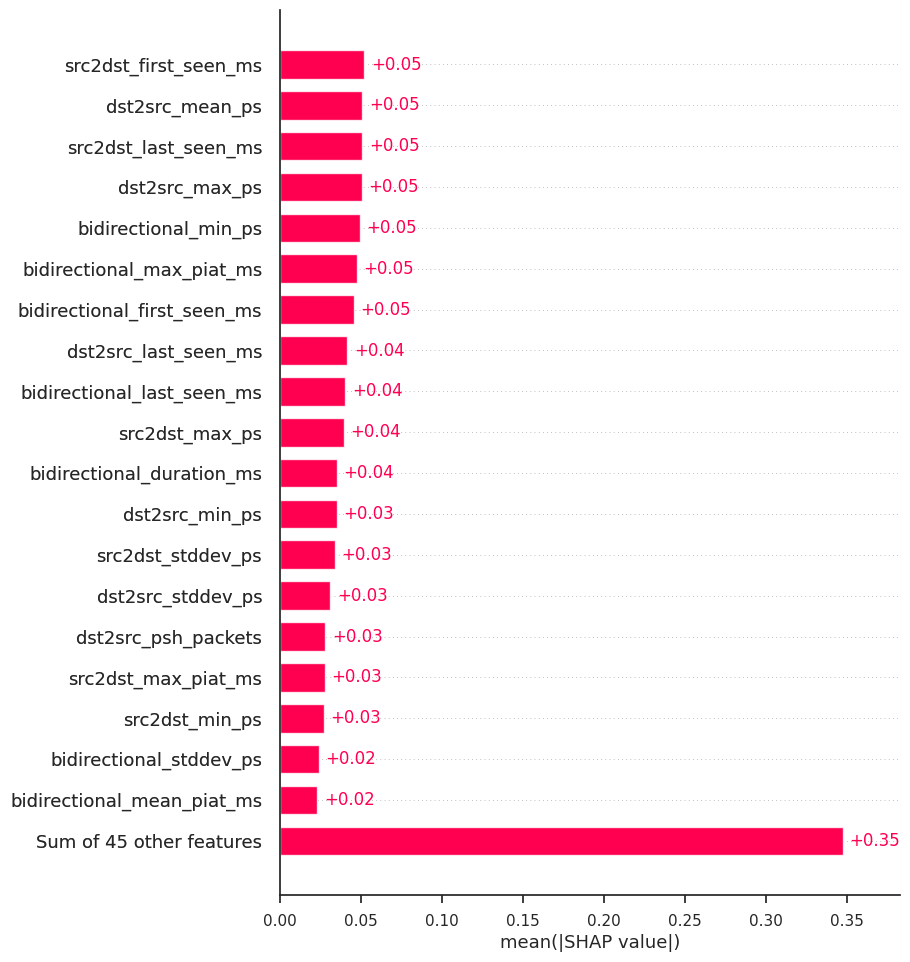

In [105]:
exp = Explanation(sv.values[:,:,12], 
                  sv.base_values[:,12], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

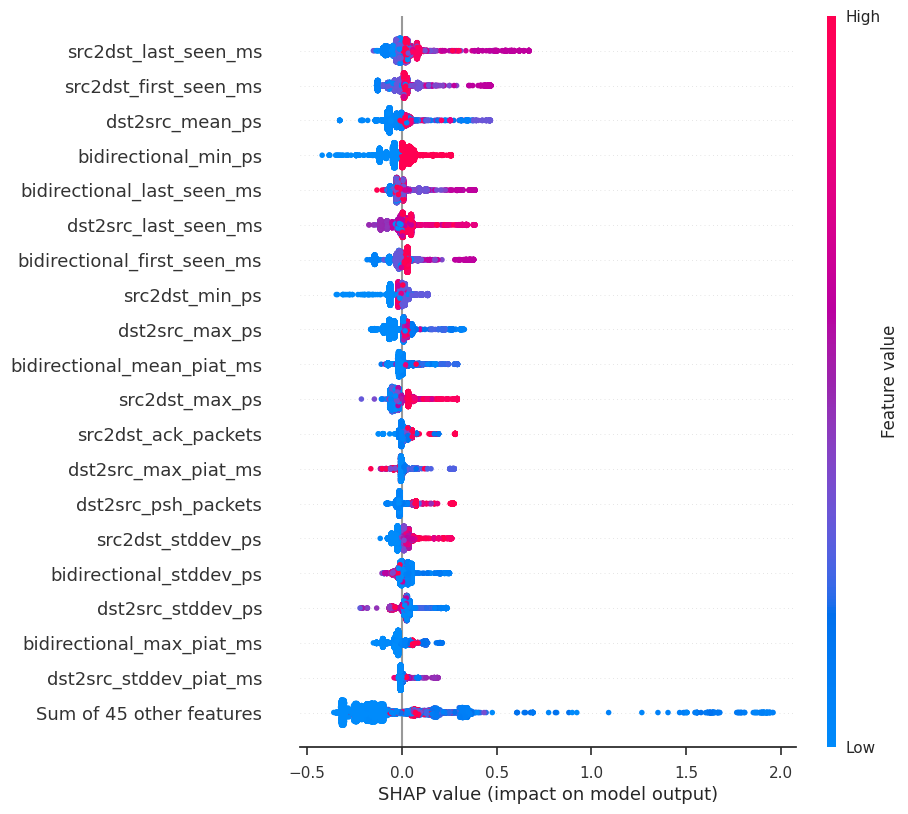

In [106]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

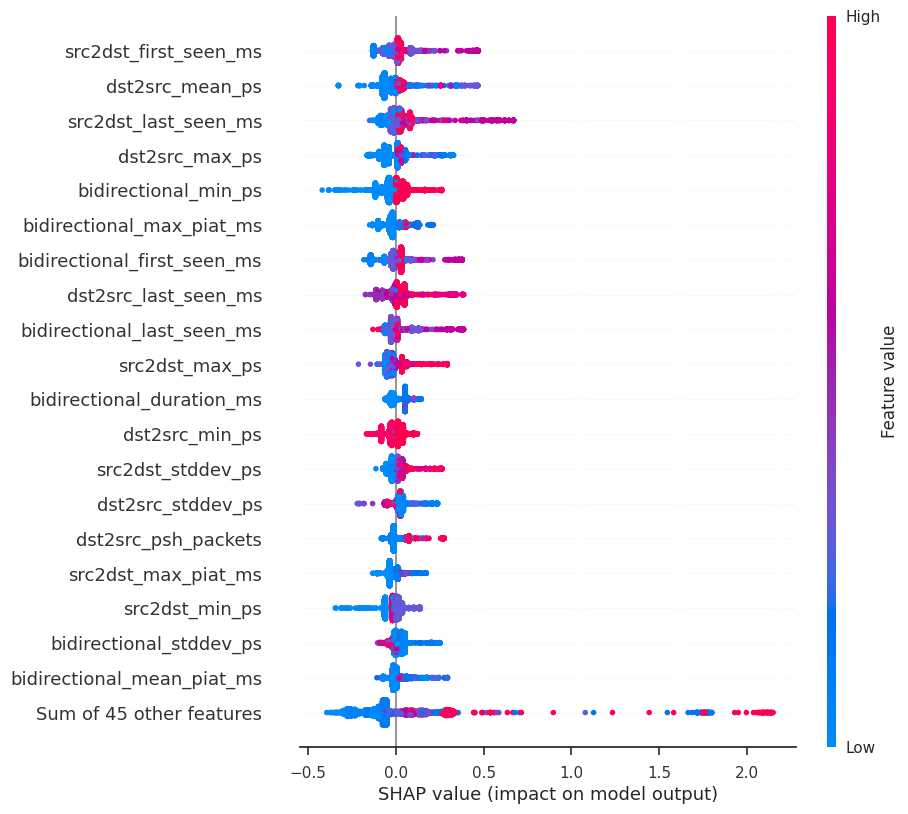

In [107]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Web Attack - Sql Injection shap

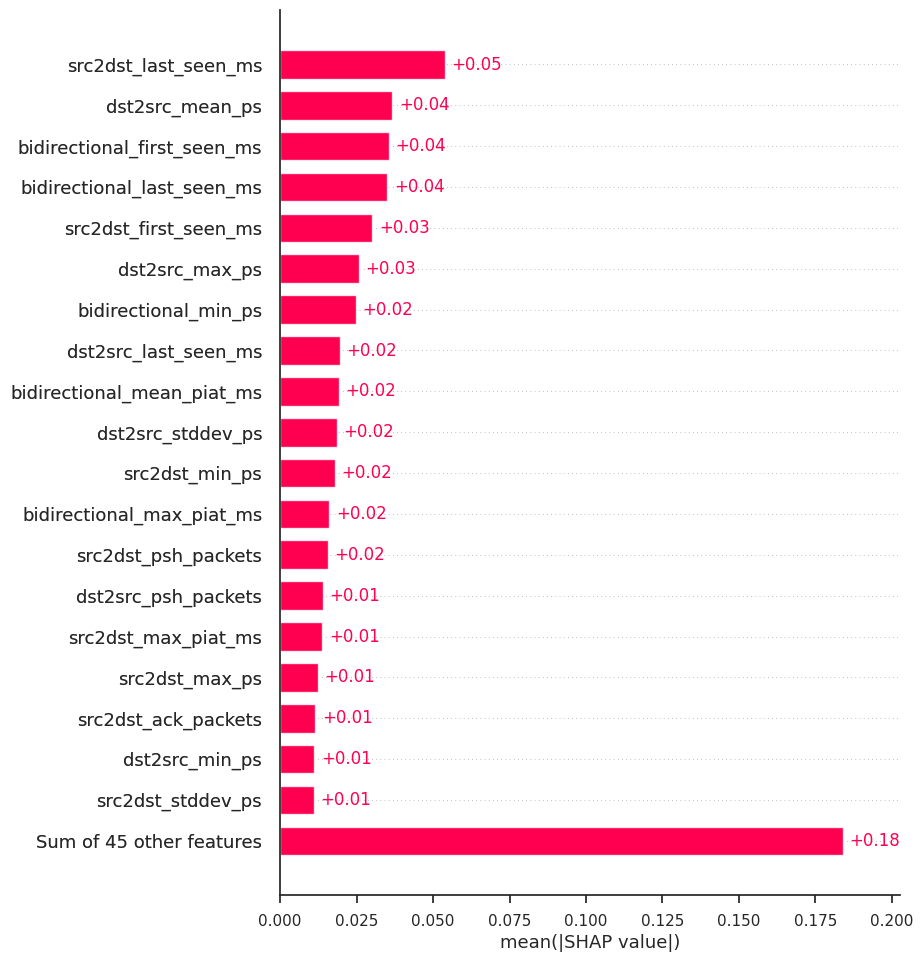

In [108]:
exp = Explanation(sv.values[:,:,13], 
                  sv.base_values[:,13], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

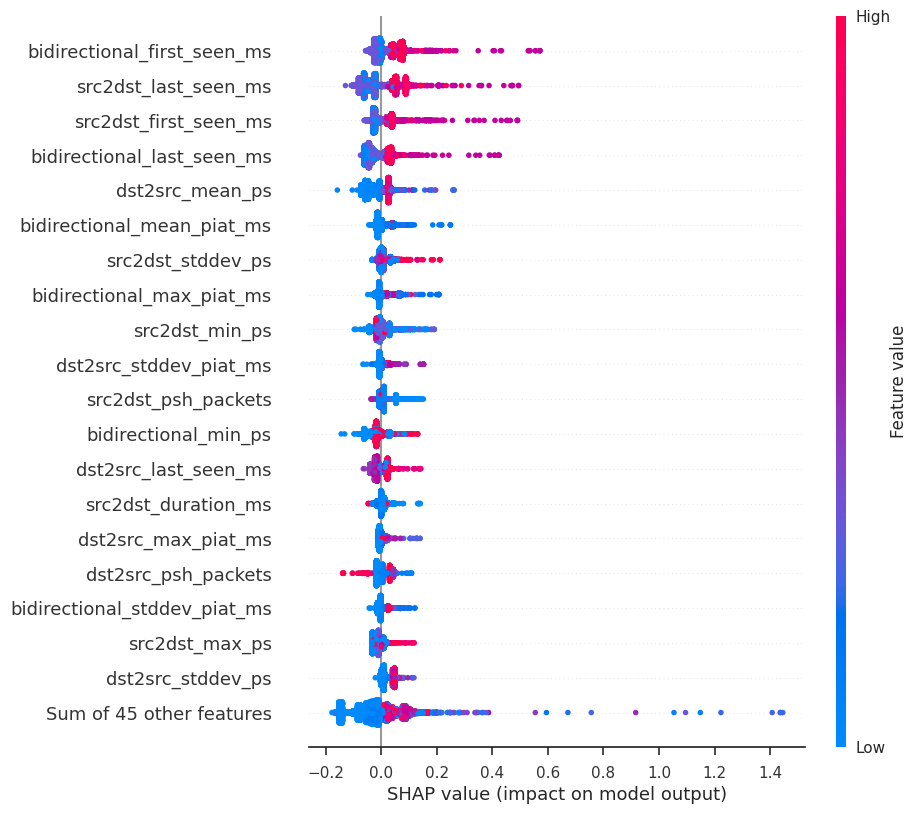

In [109]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

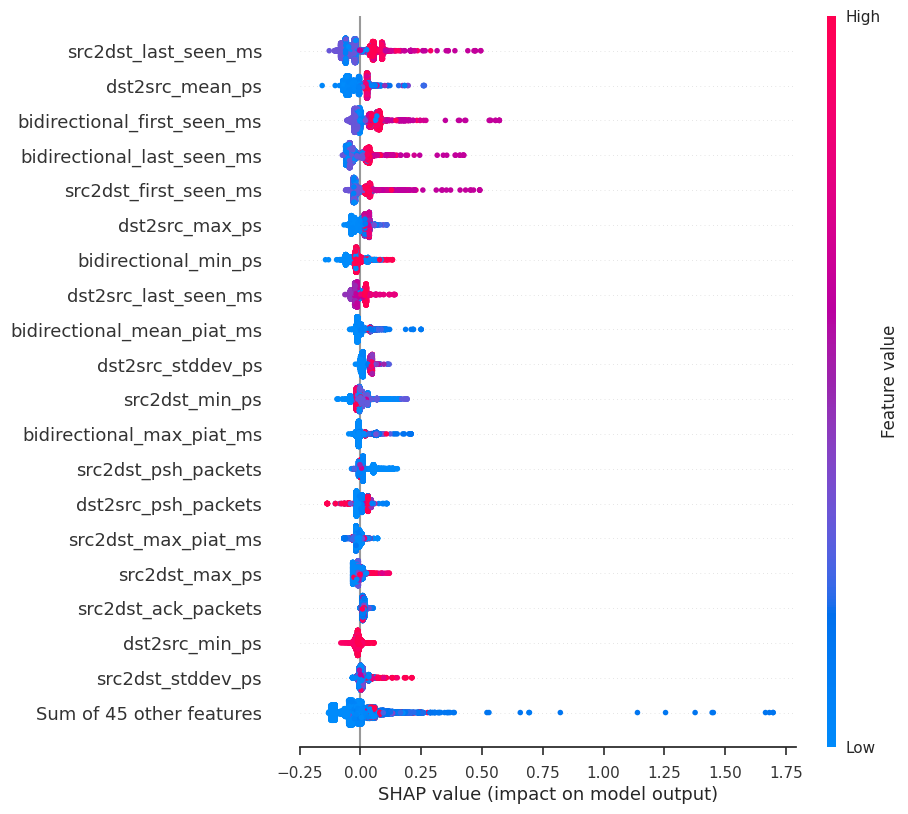

In [110]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Web Attack - XSS shap

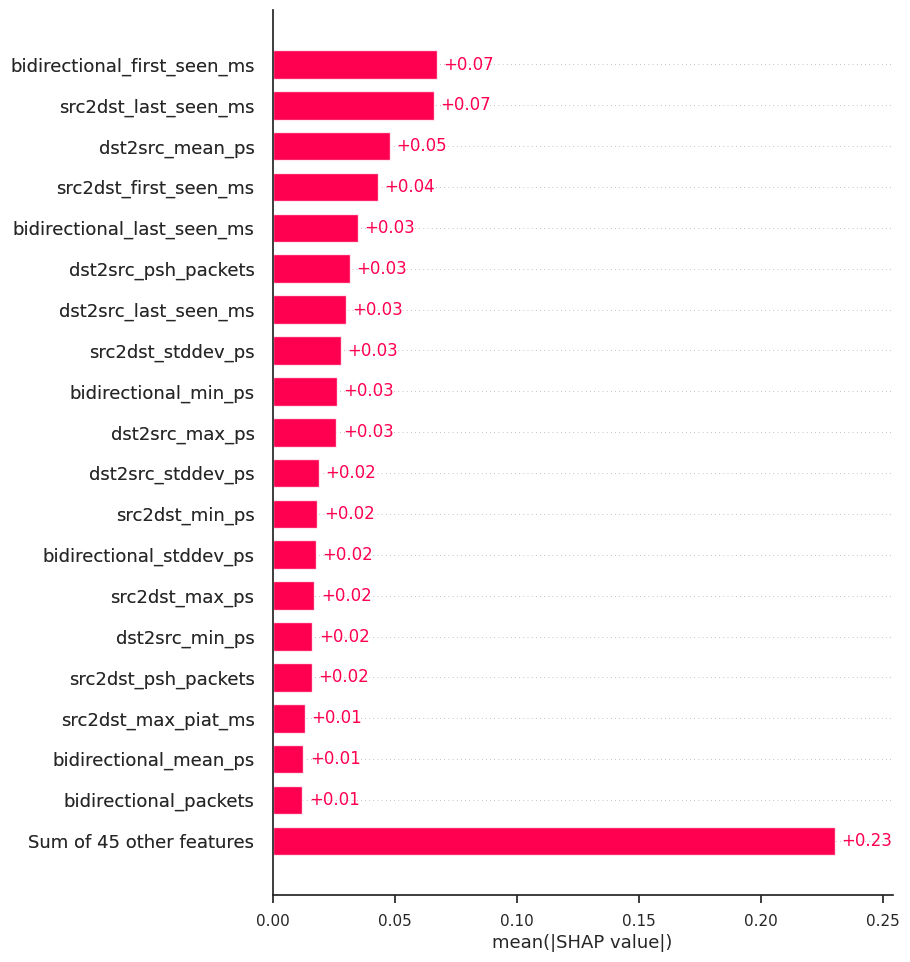

In [111]:
exp = Explanation(sv.values[:,:,14], 
                  sv.base_values[:,14], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

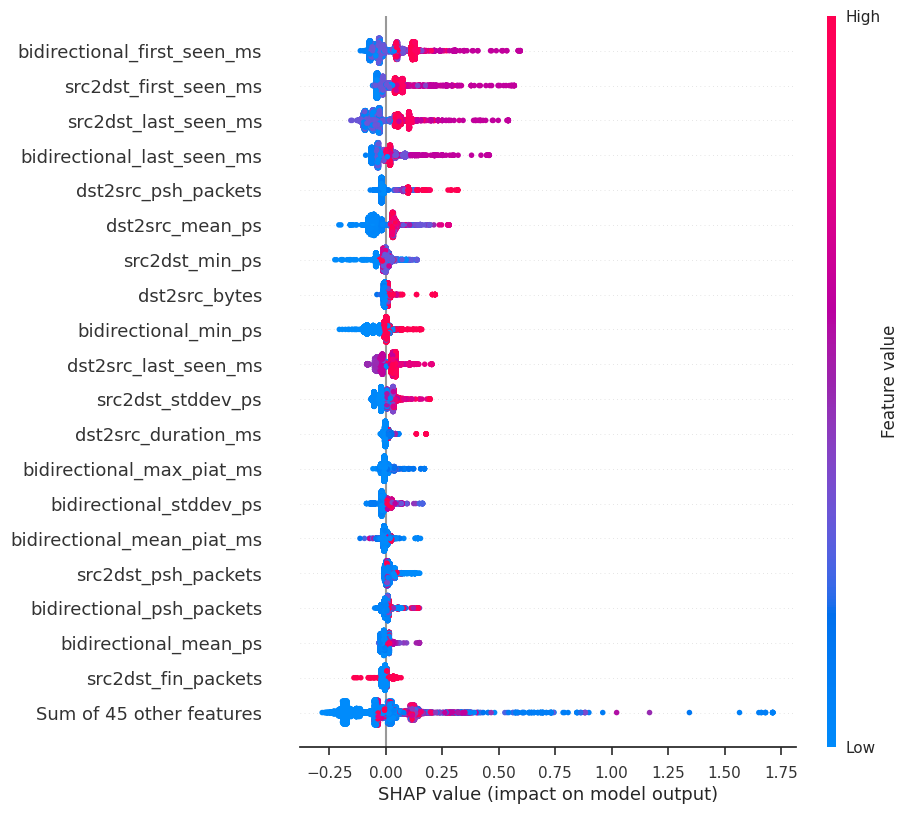

In [112]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

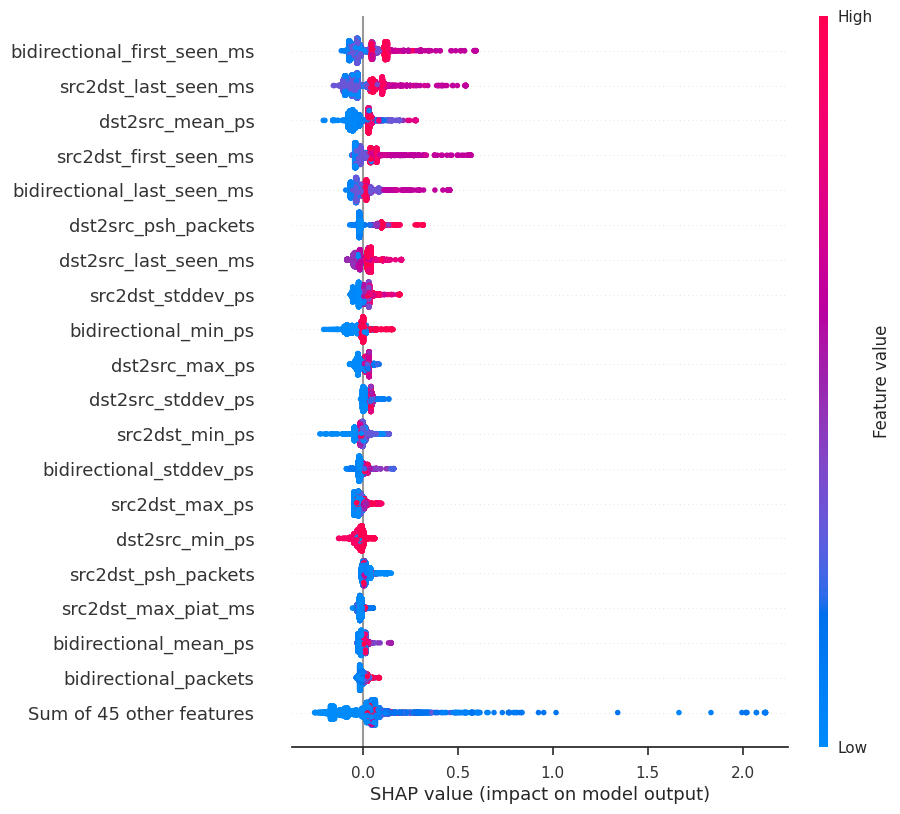

In [113]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Overall importance

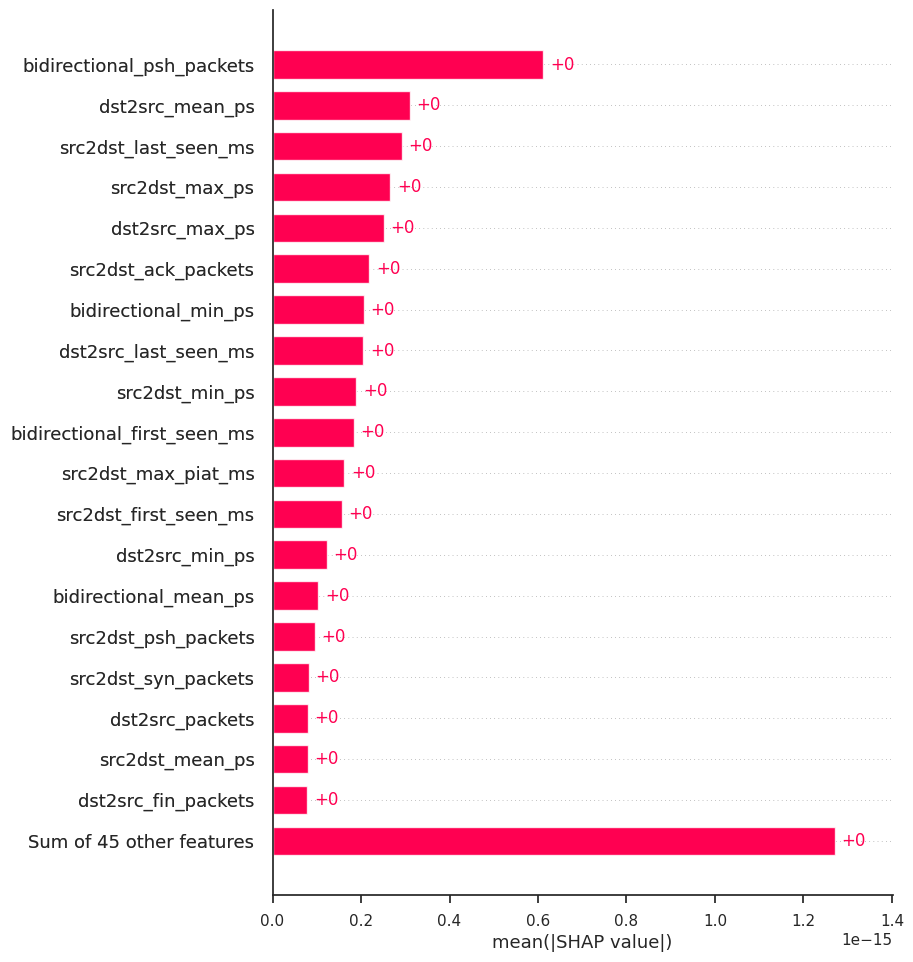

In [114]:
exp = Explanation(sv.values.mean(2), 
                  sv.base_values.mean(1), 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

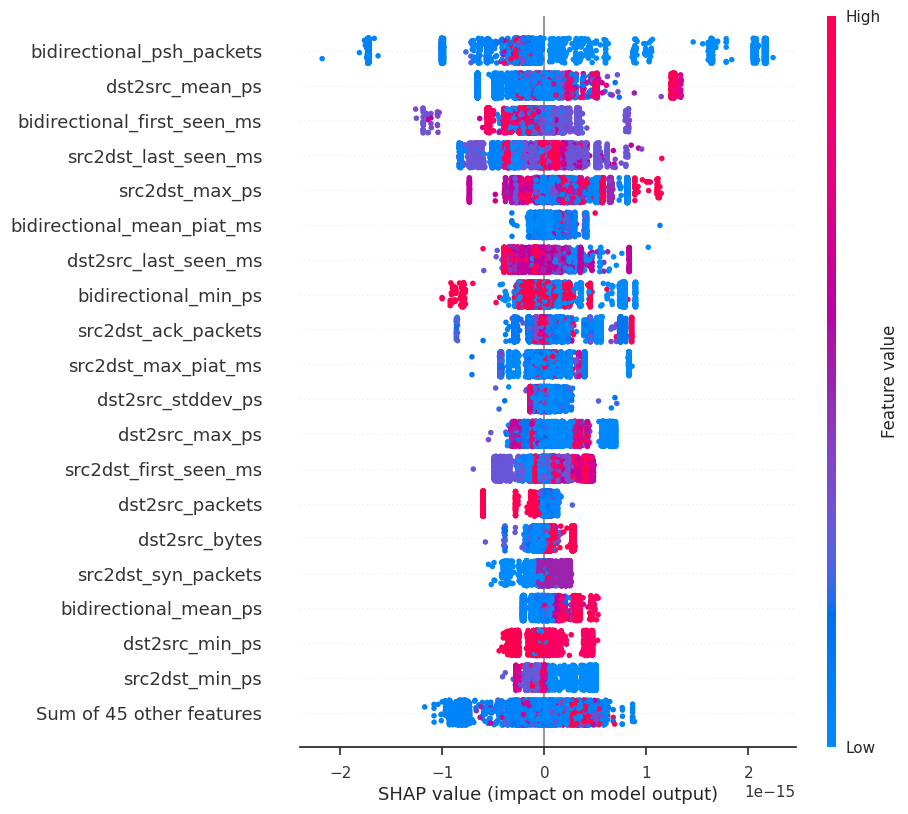

In [115]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

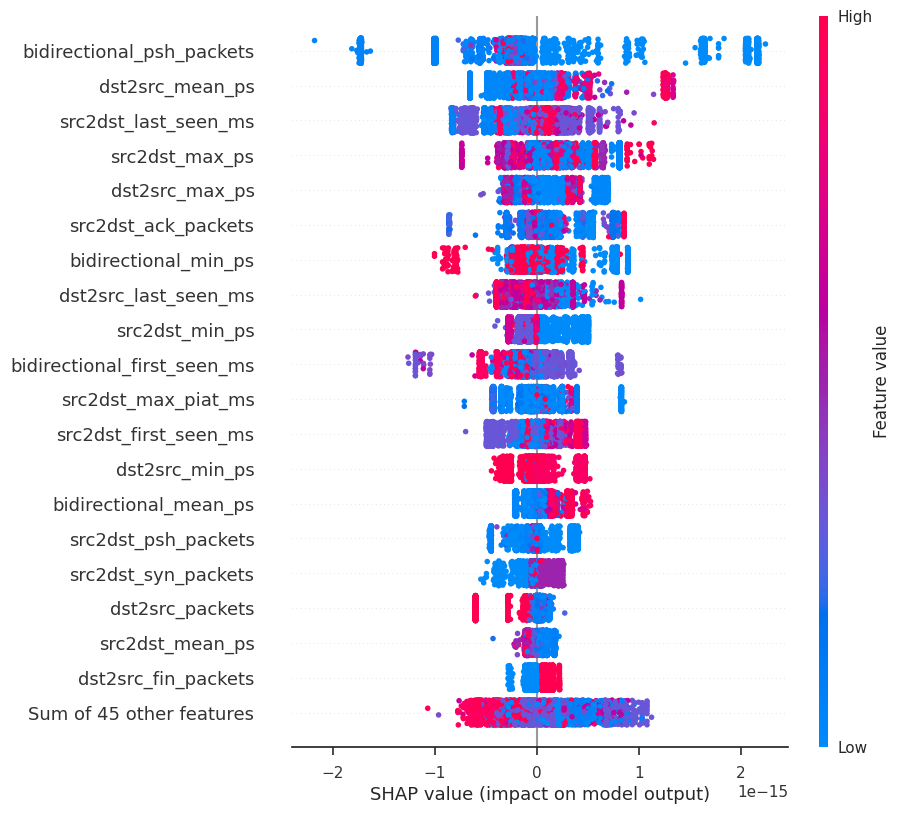

In [116]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Zero day test

In [117]:
classes = sorted(pd.unique(ds['label']).tolist())

In [119]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Bot']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7617682	total: 172ms	remaining: 13.6s
1:	learn: 1.4187876	total: 357ms	remaining: 13.9s
2:	learn: 1.1771217	total: 538ms	remaining: 13.8s
3:	learn: 1.0142049	total: 742ms	remaining: 14.1s
4:	learn: 0.8803442	total: 925ms	remaining: 13.9s
5:	learn: 0.7776540	total: 1.09s	remaining: 13.5s
6:	learn: 0.6910078	total: 1.26s	remaining: 13.2s
7:	learn: 0.6186722	total: 1.44s	remaining: 12.9s
8:	learn: 0.5554575	total: 1.64s	remaining: 13s
9:	learn: 0.4999296	total: 1.89s	remaining: 13.2s
10:	learn: 0.4526662	total: 2.15s	remaining: 13.5s
11:	learn: 0.4109568	total: 2.44s	remaining: 13.8s
12:	learn: 0.3749820	total: 2.77s	remaining: 14.3s
13:	learn: 0.3429665	total: 3.12s	remaining: 14.7s
14:	learn: 0.3139073	total: 3.48s	remaining: 15.1s
15:	learn: 0.2892785	total: 3.86s	remaining: 15.4s
16:	learn: 0.2669290	total: 4.22s	remaining: 15.6s
17:	learn: 0.2467559	total: 4.58s	remaining: 15.8s
18:	learn: 0.2281704	total: 4.95s	remaining: 15.9s
19:	learn: 0.2120107	total: 5.3s	remaining:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997817,0.896189
1,PRECISION,0.997824,0.846786
2,RECALL,0.997817,0.896189
3,F1 SCORE,0.997815,0.863657


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


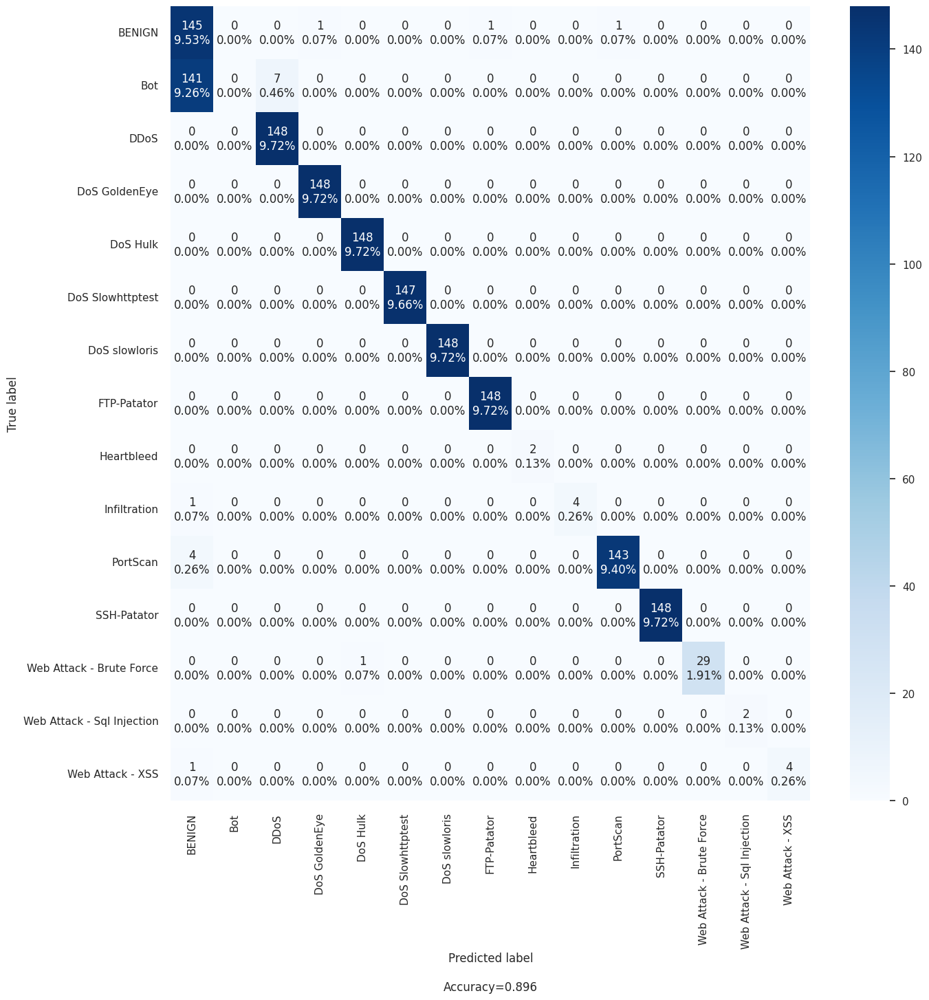

In [120]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [121]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DDoS']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7594879	total: 370ms	remaining: 29.2s
1:	learn: 1.4246610	total: 814ms	remaining: 31.7s
2:	learn: 1.1806128	total: 1.23s	remaining: 31.6s
3:	learn: 1.0099967	total: 1.64s	remaining: 31.1s
4:	learn: 0.8780968	total: 2.07s	remaining: 31.1s
5:	learn: 0.7737283	total: 2.54s	remaining: 31.3s
6:	learn: 0.6852013	total: 2.96s	remaining: 30.9s
7:	learn: 0.6136001	total: 3.23s	remaining: 29s
8:	learn: 0.5507950	total: 3.39s	remaining: 26.8s
9:	learn: 0.4958273	total: 3.57s	remaining: 25s
10:	learn: 0.4498700	total: 3.74s	remaining: 23.5s
11:	learn: 0.4092240	total: 3.9s	remaining: 22.1s
12:	learn: 0.3728470	total: 4.07s	remaining: 21s
13:	learn: 0.3418872	total: 4.24s	remaining: 20s
14:	learn: 0.3123521	total: 4.4s	remaining: 19.1s
15:	learn: 0.2888643	total: 4.57s	remaining: 18.3s
16:	learn: 0.2659353	total: 4.73s	remaining: 17.5s
17:	learn: 0.2462900	total: 4.9s	remaining: 16.9s
18:	learn: 0.2289801	total: 5.07s	remaining: 16.3s
19:	learn: 0.2127310	total: 5.24s	remaining: 15.7s
2

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997089,0.896189
1,PRECISION,0.997114,0.849875
2,RECALL,0.997089,0.896189
3,F1 SCORE,0.997085,0.864975


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


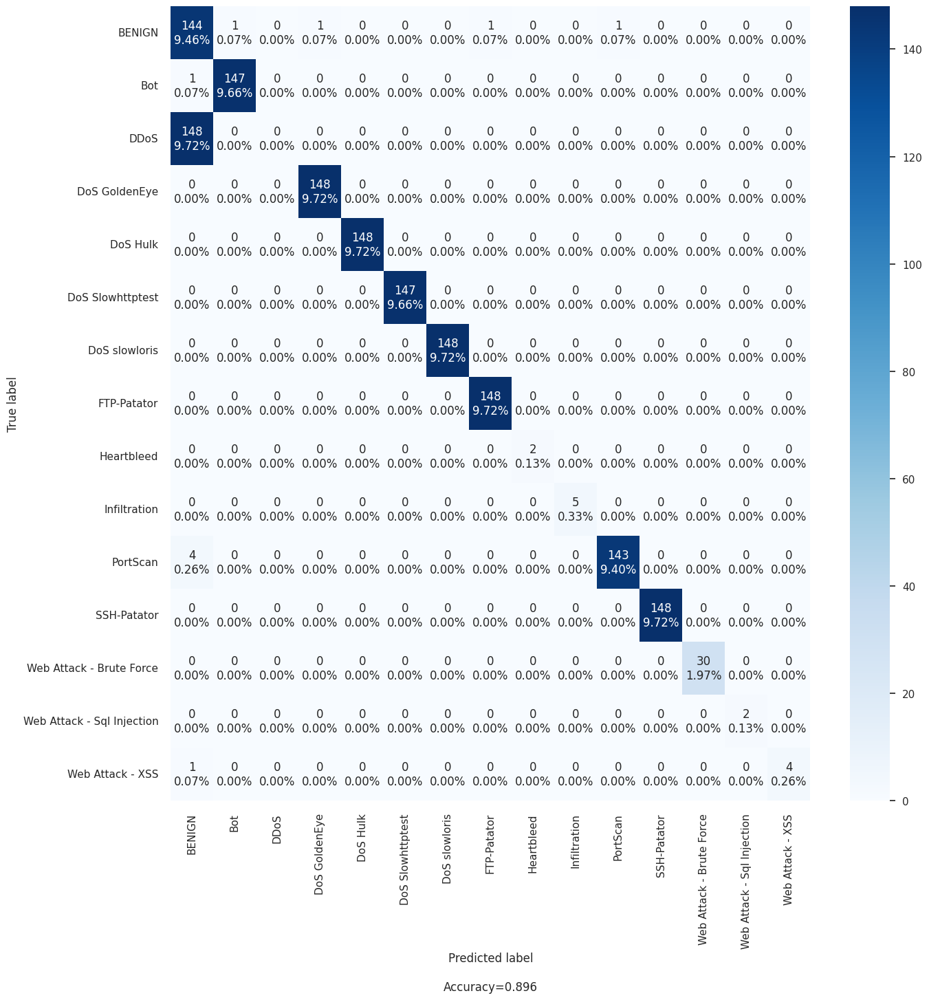

In [122]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [123]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS GoldenEye']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7182276	total: 260ms	remaining: 20.6s
1:	learn: 1.3684106	total: 513ms	remaining: 20s
2:	learn: 1.1390912	total: 782ms	remaining: 20.1s
3:	learn: 0.9787307	total: 1.06s	remaining: 20.2s
4:	learn: 0.8499360	total: 1.35s	remaining: 20.2s
5:	learn: 0.7475924	total: 1.62s	remaining: 19.9s
6:	learn: 0.6637544	total: 1.9s	remaining: 19.8s
7:	learn: 0.5934858	total: 2.18s	remaining: 19.6s
8:	learn: 0.5313972	total: 2.47s	remaining: 19.5s
9:	learn: 0.4798483	total: 2.75s	remaining: 19.3s
10:	learn: 0.4349453	total: 3.04s	remaining: 19.1s
11:	learn: 0.3959850	total: 3.37s	remaining: 19.1s
12:	learn: 0.3610236	total: 3.68s	remaining: 19s
13:	learn: 0.3304633	total: 3.97s	remaining: 18.7s
14:	learn: 0.3024832	total: 4.26s	remaining: 18.4s
15:	learn: 0.2782269	total: 4.59s	remaining: 18.3s
16:	learn: 0.2551732	total: 4.87s	remaining: 18.1s
17:	learn: 0.2360213	total: 5.16s	remaining: 17.8s
18:	learn: 0.2178361	total: 5.44s	remaining: 17.5s
19:	learn: 0.2024429	total: 5.72s	remaining: 1

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998181,0.897503
1,PRECISION,0.998185,0.839447
2,RECALL,0.998181,0.897503
3,F1 SCORE,0.998179,0.861256


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


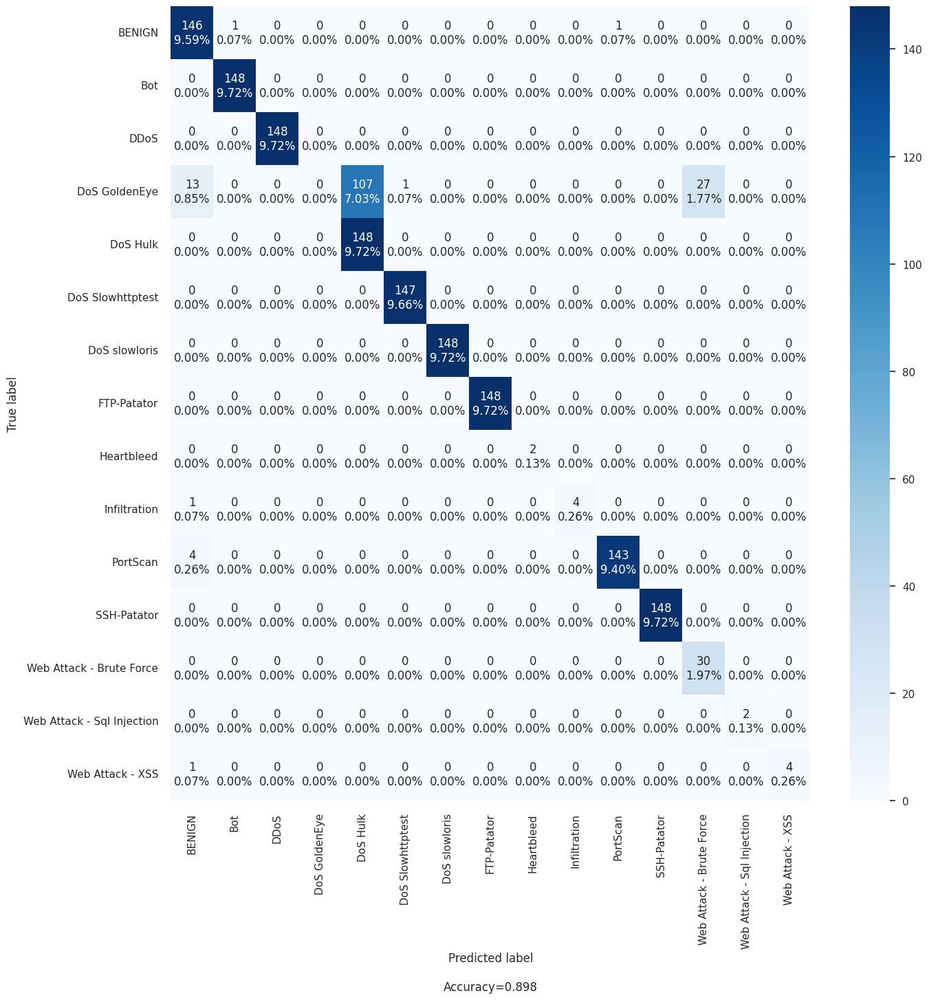

In [124]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [125]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS Hulk']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.6820887	total: 165ms	remaining: 13s
1:	learn: 1.3487723	total: 340ms	remaining: 13.3s
2:	learn: 1.1347998	total: 517ms	remaining: 13.3s
3:	learn: 0.9751699	total: 706ms	remaining: 13.4s
4:	learn: 0.8507958	total: 887ms	remaining: 13.3s
5:	learn: 0.7513466	total: 1.06s	remaining: 13s
6:	learn: 0.6683697	total: 1.23s	remaining: 12.8s
7:	learn: 0.5976877	total: 1.4s	remaining: 12.6s
8:	learn: 0.5362567	total: 1.57s	remaining: 12.4s
9:	learn: 0.4845529	total: 1.74s	remaining: 12.2s
10:	learn: 0.4405484	total: 1.91s	remaining: 12s
11:	learn: 0.4002358	total: 2.08s	remaining: 11.8s
12:	learn: 0.3660607	total: 2.26s	remaining: 11.6s
13:	learn: 0.3350208	total: 2.43s	remaining: 11.4s
14:	learn: 0.3065055	total: 2.6s	remaining: 11.3s
15:	learn: 0.2833932	total: 2.77s	remaining: 11.1s
16:	learn: 0.2611912	total: 2.97s	remaining: 11s
17:	learn: 0.2420627	total: 3.14s	remaining: 10.8s
18:	learn: 0.2244077	total: 3.31s	remaining: 10.6s
19:	learn: 0.2090213	total: 3.5s	remaining: 10.5s
2

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997089,0.895532
1,PRECISION,0.997111,0.845998
2,RECALL,0.997089,0.895532
3,F1 SCORE,0.997085,0.862728


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


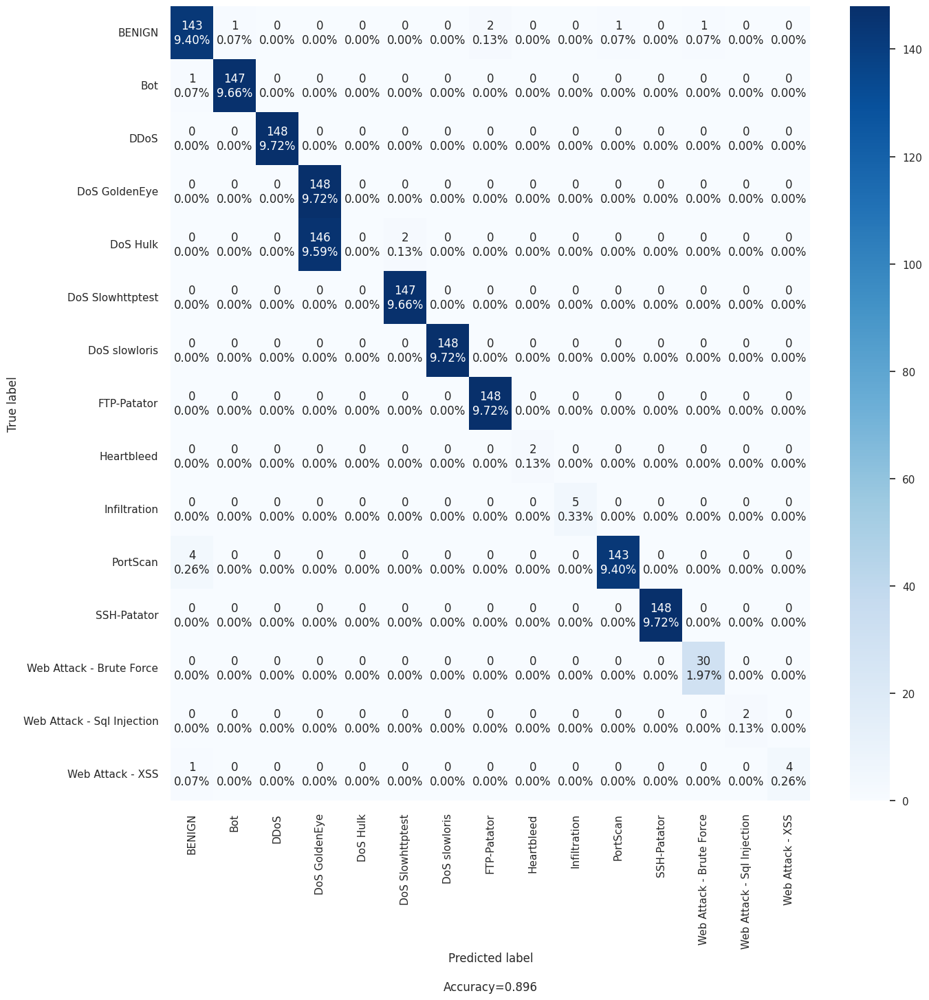

In [126]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [127]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS Slowhttptest']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7188667	total: 336ms	remaining: 26.5s
1:	learn: 1.3902523	total: 696ms	remaining: 27.1s
2:	learn: 1.1578901	total: 1.07s	remaining: 27.4s


3:	learn: 0.9933870	total: 1.45s	remaining: 27.6s
4:	learn: 0.8662965	total: 1.85s	remaining: 27.7s
5:	learn: 0.7589781	total: 2.31s	remaining: 28.5s
6:	learn: 0.6747833	total: 2.83s	remaining: 29.5s
7:	learn: 0.6029467	total: 3.24s	remaining: 29.1s
8:	learn: 0.5414682	total: 3.62s	remaining: 28.6s
9:	learn: 0.4878009	total: 4s	remaining: 28s
10:	learn: 0.4418963	total: 4.42s	remaining: 27.7s
11:	learn: 0.4012520	total: 4.79s	remaining: 27.1s
12:	learn: 0.3661078	total: 5.16s	remaining: 26.6s
13:	learn: 0.3355244	total: 5.5s	remaining: 25.9s
14:	learn: 0.3069161	total: 5.82s	remaining: 25.2s
15:	learn: 0.2823807	total: 6.16s	remaining: 24.7s
16:	learn: 0.2588885	total: 6.51s	remaining: 24.1s
17:	learn: 0.2395335	total: 6.83s	remaining: 23.5s
18:	learn: 0.2213723	total: 7.15s	remaining: 23s
19:	learn: 0.2050567	total: 7.48s	remaining: 22.4s
20:	learn: 0.1903619	total: 7.79s	remaining: 21.9s
21:	learn: 0.1770475	total: 8.12s	remaining: 21.4s
22:	learn: 0.1652142	total: 8.47s	remaining: 2

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998180,0.896846
1,PRECISION,0.998184,0.847561
2,RECALL,0.998180,0.896846
3,F1 SCORE,0.998179,0.864107


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


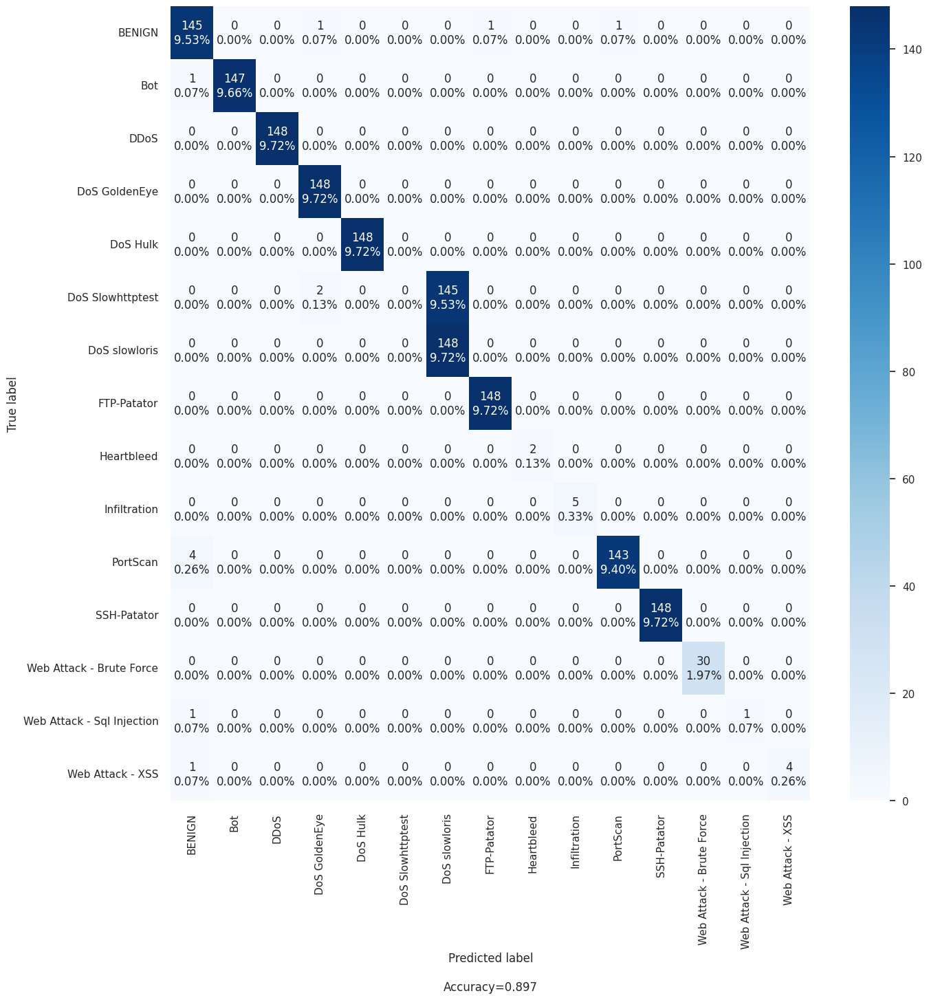

In [128]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [129]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS slowloris']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.6968518	total: 291ms	remaining: 23s


1:	learn: 1.3554642	total: 647ms	remaining: 25.2s
2:	learn: 1.1355634	total: 1.07s	remaining: 27.4s
3:	learn: 0.9755075	total: 1.45s	remaining: 27.5s
4:	learn: 0.8449173	total: 1.83s	remaining: 27.5s
5:	learn: 0.7429830	total: 2.18s	remaining: 26.9s
6:	learn: 0.6624369	total: 2.54s	remaining: 26.5s
7:	learn: 0.5929762	total: 2.92s	remaining: 26.3s
8:	learn: 0.5329164	total: 3.26s	remaining: 25.8s
9:	learn: 0.4808698	total: 3.6s	remaining: 25.2s
10:	learn: 0.4359128	total: 3.95s	remaining: 24.8s
11:	learn: 0.3955962	total: 4.31s	remaining: 24.4s
12:	learn: 0.3606447	total: 4.67s	remaining: 24.1s
13:	learn: 0.3301506	total: 5.07s	remaining: 23.9s
14:	learn: 0.3025915	total: 5.46s	remaining: 23.6s
15:	learn: 0.2778428	total: 5.87s	remaining: 23.5s
16:	learn: 0.2555184	total: 6.28s	remaining: 23.3s
17:	learn: 0.2359804	total: 6.69s	remaining: 23.1s
18:	learn: 0.2181968	total: 7.13s	remaining: 22.9s
19:	learn: 0.2022155	total: 7.59s	remaining: 22.8s
20:	learn: 0.1884830	total: 8.04s	remaini

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997999,0.896189
1,PRECISION,0.998002,0.847824
2,RECALL,0.997999,0.896189
3,F1 SCORE,0.997999,0.863795


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


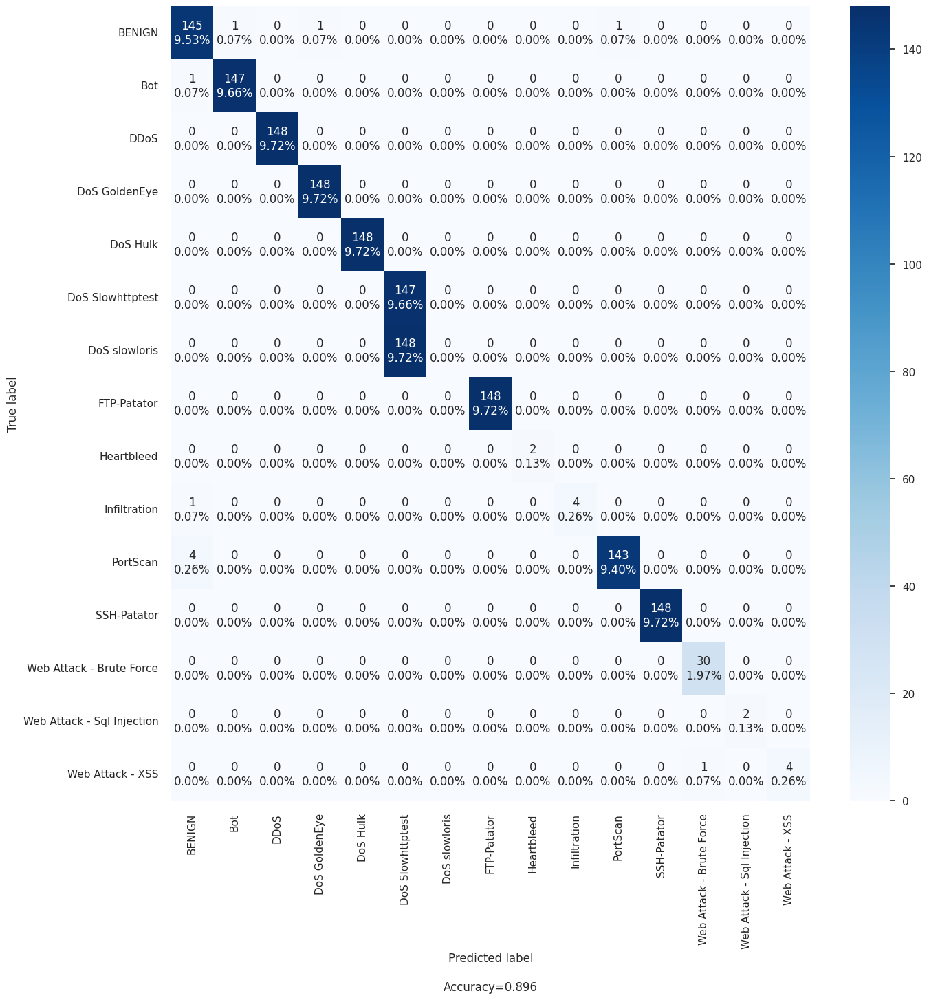

In [130]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [131]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'FTP-Patator']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7149975	total: 393ms	remaining: 31.1s
1:	learn: 1.3825946	total: 790ms	remaining: 30.8s
2:	learn: 1.1591579	total: 1.19s	remaining: 30.6s
3:	learn: 0.9940664	total: 1.58s	remaining: 30.1s
4:	learn: 0.8632247	total: 1.99s	remaining: 29.8s
5:	learn: 0.7582133	total: 2.37s	remaining: 29.2s
6:	learn: 0.6737687	total: 2.77s	remaining: 28.9s
7:	learn: 0.6024665	total: 3.2s	remaining: 28.8s
8:	learn: 0.5414412	total: 3.62s	remaining: 28.6s
9:	learn: 0.4885038	total: 4.03s	remaining: 28.2s
10:	learn: 0.4431328	total: 4.52s	remaining: 28.4s
11:	learn: 0.4020996	total: 5s	remaining: 28.4s
12:	learn: 0.3671740	total: 5.42s	remaining: 27.9s
13:	learn: 0.3364622	total: 5.87s	remaining: 27.7s
14:	learn: 0.3085869	total: 6.28s	remaining: 27.2s
15:	learn: 0.2849749	total: 6.67s	remaining: 26.7s
16:	learn: 0.2623011	total: 7.06s	remaining: 26.2s
17:	learn: 0.2423349	total: 7.5s	remaining: 25.8s
18:	learn: 0.2235664	total: 7.93s	remaining: 25.5s
19:	learn: 0.2079476	total: 8.36s	remaining: 2

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997635,0.892904
1,PRECISION,0.997645,0.847705
2,RECALL,0.997635,0.892904
3,F1 SCORE,0.997634,0.861958


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


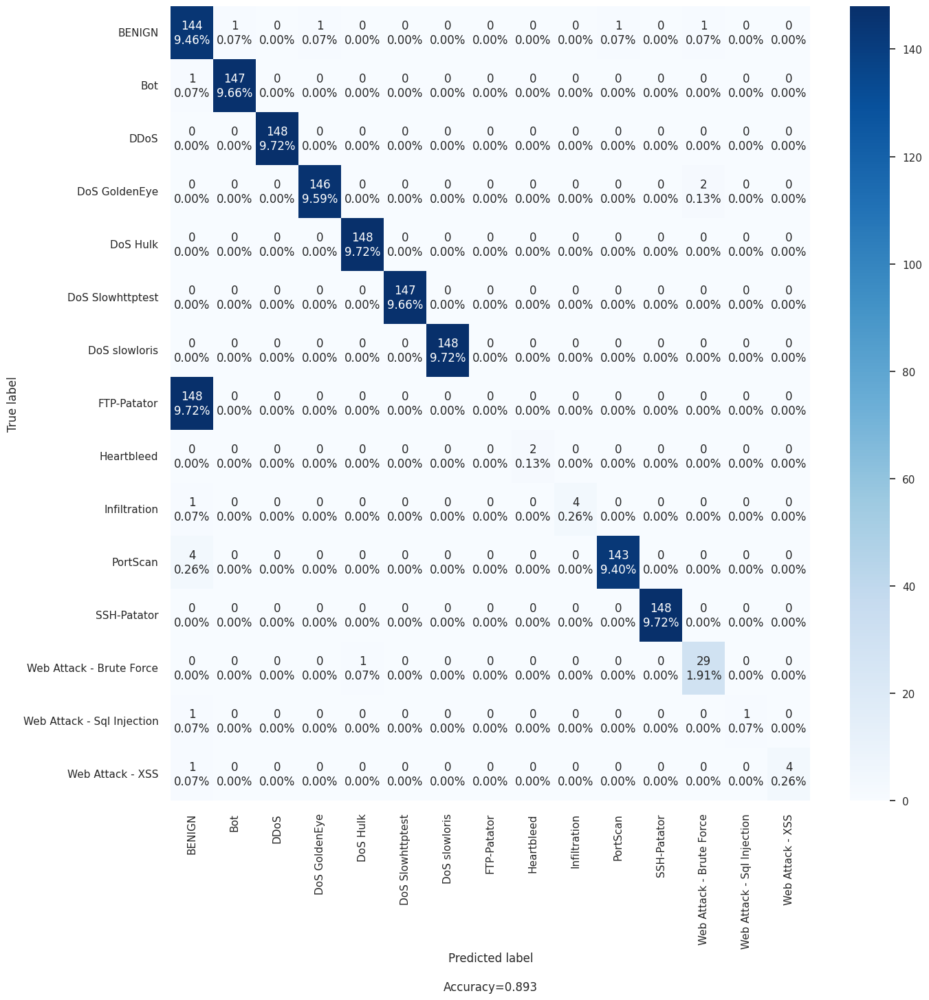

In [132]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [133]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Heartbleed']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7687080	total: 398ms	remaining: 31.4s
1:	learn: 1.4110588	total: 818ms	remaining: 31.9s
2:	learn: 1.1703051	total: 1.22s	remaining: 31.3s
3:	learn: 1.0020648	total: 1.67s	remaining: 31.7s
4:	learn: 0.8694299	total: 2.1s	remaining: 31.5s
5:	learn: 0.7627634	total: 2.57s	remaining: 31.6s
6:	learn: 0.6773303	total: 2.98s	remaining: 31.1s
7:	learn: 0.6057048	total: 3.39s	remaining: 30.5s
8:	learn: 0.5438753	total: 3.88s	remaining: 30.6s
9:	learn: 0.4906930	total: 4.41s	remaining: 30.9s
10:	learn: 0.4443212	total: 4.83s	remaining: 30.3s
11:	learn: 0.4033119	total: 5.22s	remaining: 29.6s
12:	learn: 0.3680932	total: 5.63s	remaining: 29s
13:	learn: 0.3376810	total: 6.01s	remaining: 28.4s
14:	learn: 0.3087000	total: 6.42s	remaining: 27.8s
15:	learn: 0.2834257	total: 6.81s	remaining: 27.2s
16:	learn: 0.2609170	total: 7.2s	remaining: 26.7s
17:	learn: 0.2410295	total: 7.58s	remaining: 26.1s
18:	learn: 0.2231288	total: 7.96s	remaining: 25.5s
19:	learn: 0.2070353	total: 8.33s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997038,0.992773
1,PRECISION,0.997042,0.991635
2,RECALL,0.997038,0.992773
3,F1 SCORE,0.997030,0.992118


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


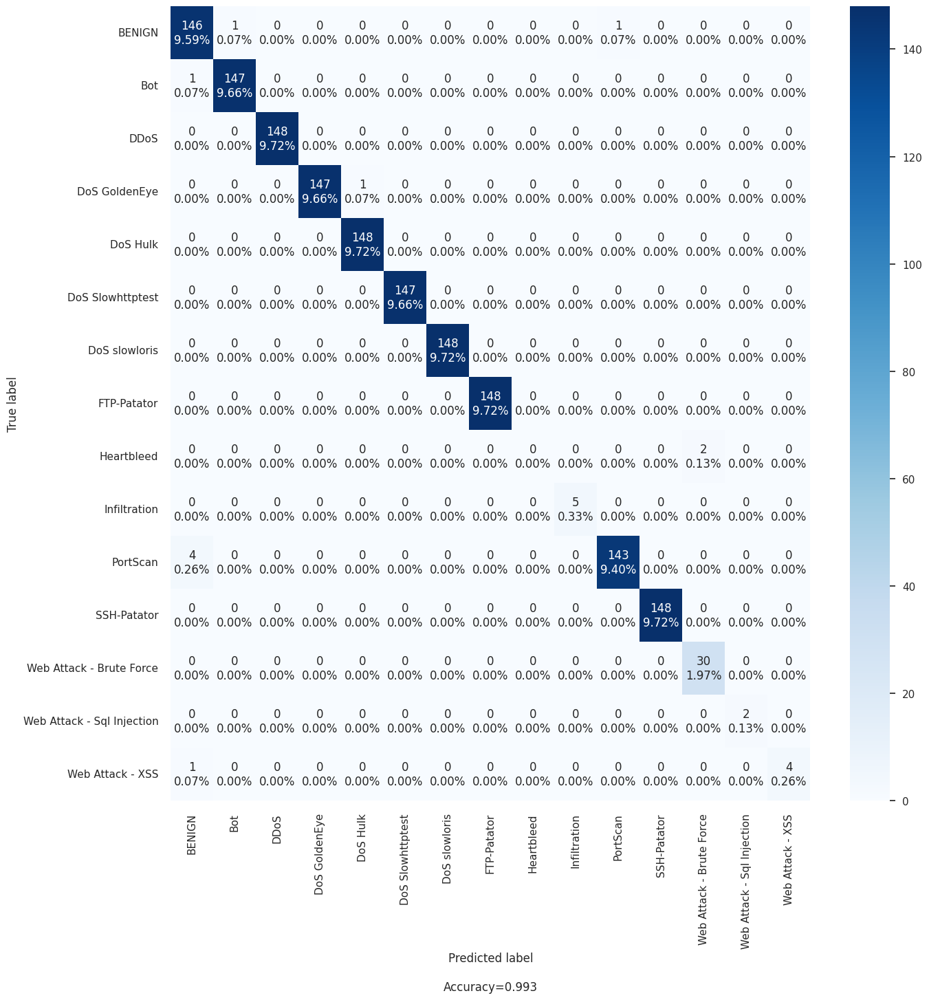

In [134]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [135]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Infiltration']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7433317	total: 408ms	remaining: 32.2s


1:	learn: 1.4077542	total: 865ms	remaining: 33.7s
2:	learn: 1.1685667	total: 1.22s	remaining: 31.4s
3:	learn: 1.0028054	total: 1.57s	remaining: 29.9s
4:	learn: 0.8708758	total: 1.96s	remaining: 29.5s
5:	learn: 0.7645957	total: 2.33s	remaining: 28.7s
6:	learn: 0.6800094	total: 2.69s	remaining: 28s
7:	learn: 0.6063253	total: 3.04s	remaining: 27.4s
8:	learn: 0.5433376	total: 3.41s	remaining: 26.9s
9:	learn: 0.4894431	total: 3.77s	remaining: 26.4s
10:	learn: 0.4441303	total: 4.12s	remaining: 25.9s
11:	learn: 0.4038419	total: 4.48s	remaining: 25.4s
12:	learn: 0.3684160	total: 4.85s	remaining: 25s
13:	learn: 0.3354526	total: 5.21s	remaining: 24.6s
14:	learn: 0.3062638	total: 5.6s	remaining: 24.3s
15:	learn: 0.2809025	total: 5.96s	remaining: 23.8s
16:	learn: 0.2584358	total: 6.33s	remaining: 23.4s
17:	learn: 0.2393483	total: 6.7s	remaining: 23.1s
18:	learn: 0.2212556	total: 7.07s	remaining: 22.7s
19:	learn: 0.2050318	total: 7.44s	remaining: 22.3s
20:	learn: 0.1905064	total: 7.82s	remaining: 2

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997691,0.989488
1,PRECISION,0.997697,0.986649
2,RECALL,0.997691,0.989488
3,F1 SCORE,0.997684,0.987824


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


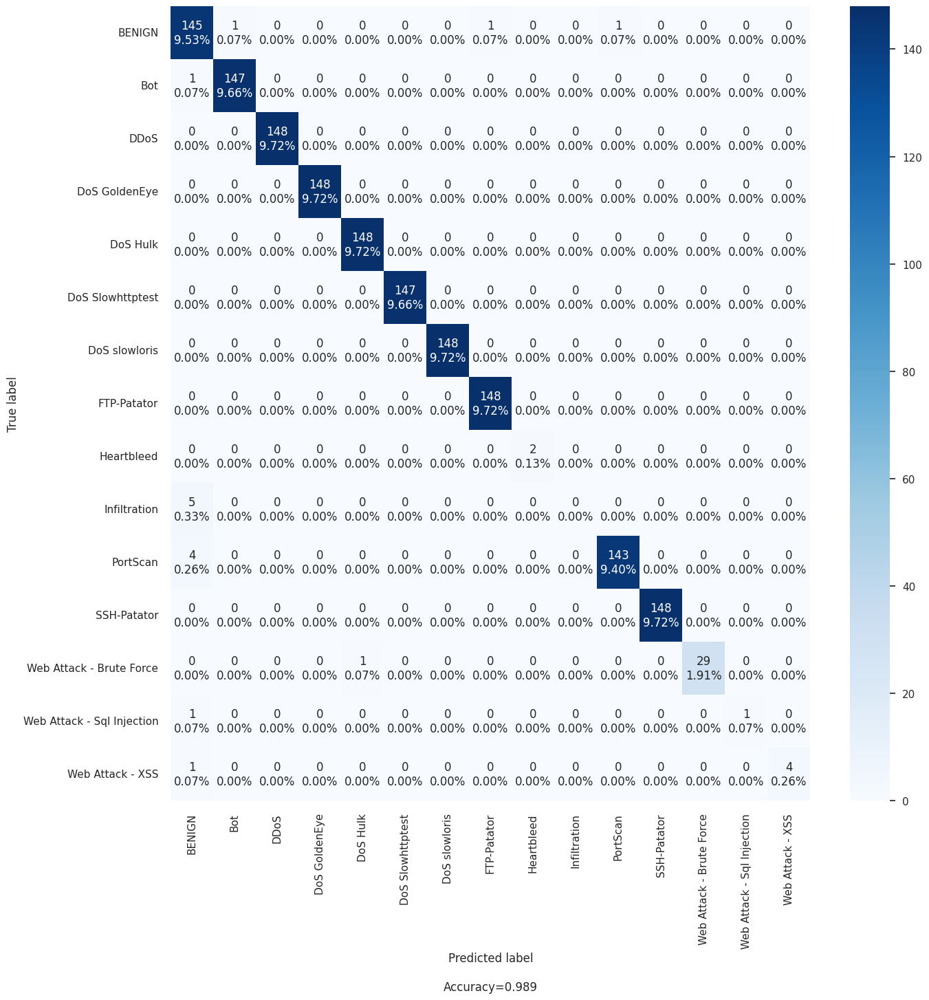

In [136]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [137]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'PortScan']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.6654557	total: 256ms	remaining: 20.3s
1:	learn: 1.3499393	total: 519ms	remaining: 20.2s
2:	learn: 1.1267884	total: 800ms	remaining: 20.5s
3:	learn: 0.9640674	total: 1.09s	remaining: 20.8s
4:	learn: 0.8397610	total: 1.4s	remaining: 20.9s
5:	learn: 0.7386472	total: 1.72s	remaining: 21.2s
6:	learn: 0.6552989	total: 2.02s	remaining: 21.1s
7:	learn: 0.5847753	total: 2.34s	remaining: 21.1s
8:	learn: 0.5243994	total: 2.64s	remaining: 20.8s
9:	learn: 0.4728994	total: 2.96s	remaining: 20.8s
10:	learn: 0.4291675	total: 3.26s	remaining: 20.4s
11:	learn: 0.3896600	total: 3.56s	remaining: 20.2s
12:	learn: 0.3549730	total: 3.9s	remaining: 20.1s
13:	learn: 0.3248807	total: 4.23s	remaining: 19.9s
14:	learn: 0.2972660	total: 4.53s	remaining: 19.6s
15:	learn: 0.2733015	total: 4.87s	remaining: 19.5s
16:	learn: 0.2517376	total: 5.21s	remaining: 19.3s
17:	learn: 0.2318889	total: 5.56s	remaining: 19.1s
18:	learn: 0.2144360	total: 5.88s	remaining: 18.9s
19:	learn: 0.1983801	total: 6.18s	remaining

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997635,0.900131
1,PRECISION,0.997660,0.851114
2,RECALL,0.997635,0.900131
3,F1 SCORE,0.997617,0.867988


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


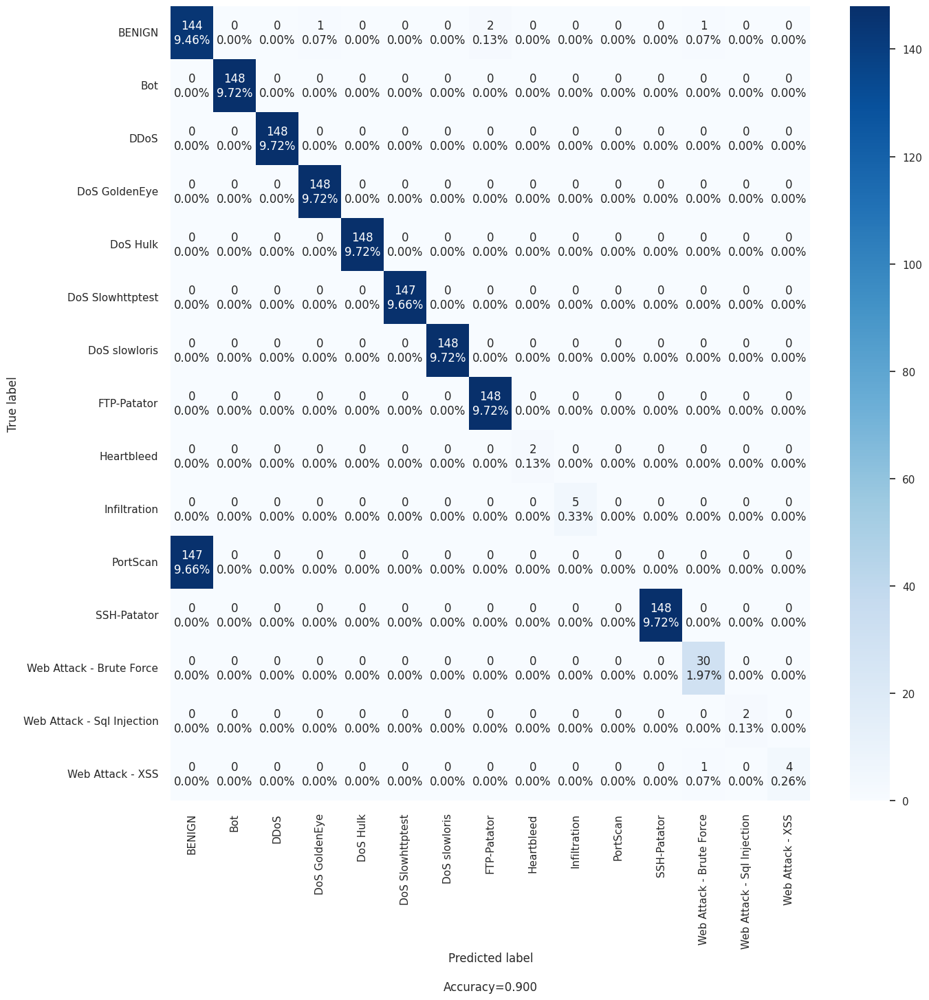

In [138]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [139]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'SSH-Patator']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.6981829	total: 260ms	remaining: 20.5s
1:	learn: 1.3742021	total: 523ms	remaining: 20.4s
2:	learn: 1.1508707	total: 812ms	remaining: 20.8s
3:	learn: 0.9872427	total: 1.11s	remaining: 21.1s
4:	learn: 0.8589336	total: 1.44s	remaining: 21.6s
5:	learn: 0.7550179	total: 1.77s	remaining: 21.8s
6:	learn: 0.6700742	total: 2.11s	remaining: 22s
7:	learn: 0.5961631	total: 2.45s	remaining: 22.1s
8:	learn: 0.5333546	total: 2.79s	remaining: 22s
9:	learn: 0.4812240	total: 3.14s	remaining: 22s
10:	learn: 0.4361398	total: 3.49s	remaining: 21.9s
11:	learn: 0.3976430	total: 3.85s	remaining: 21.8s
12:	learn: 0.3635562	total: 4.21s	remaining: 21.7s
13:	learn: 0.3319974	total: 4.56s	remaining: 21.5s
14:	learn: 0.3045642	total: 4.92s	remaining: 21.3s
15:	learn: 0.2805975	total: 5.28s	remaining: 21.1s
16:	learn: 0.2579756	total: 5.63s	remaining: 20.9s
17:	learn: 0.2380268	total: 5.98s	remaining: 20.6s
18:	learn: 0.2206936	total: 6.33s	remaining: 20.3s
19:	learn: 0.2038334	total: 6.7s	remaining: 20.

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997453,0.896846
1,PRECISION,0.997456,0.851358
2,RECALL,0.997453,0.896846
3,F1 SCORE,0.997448,0.865711


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


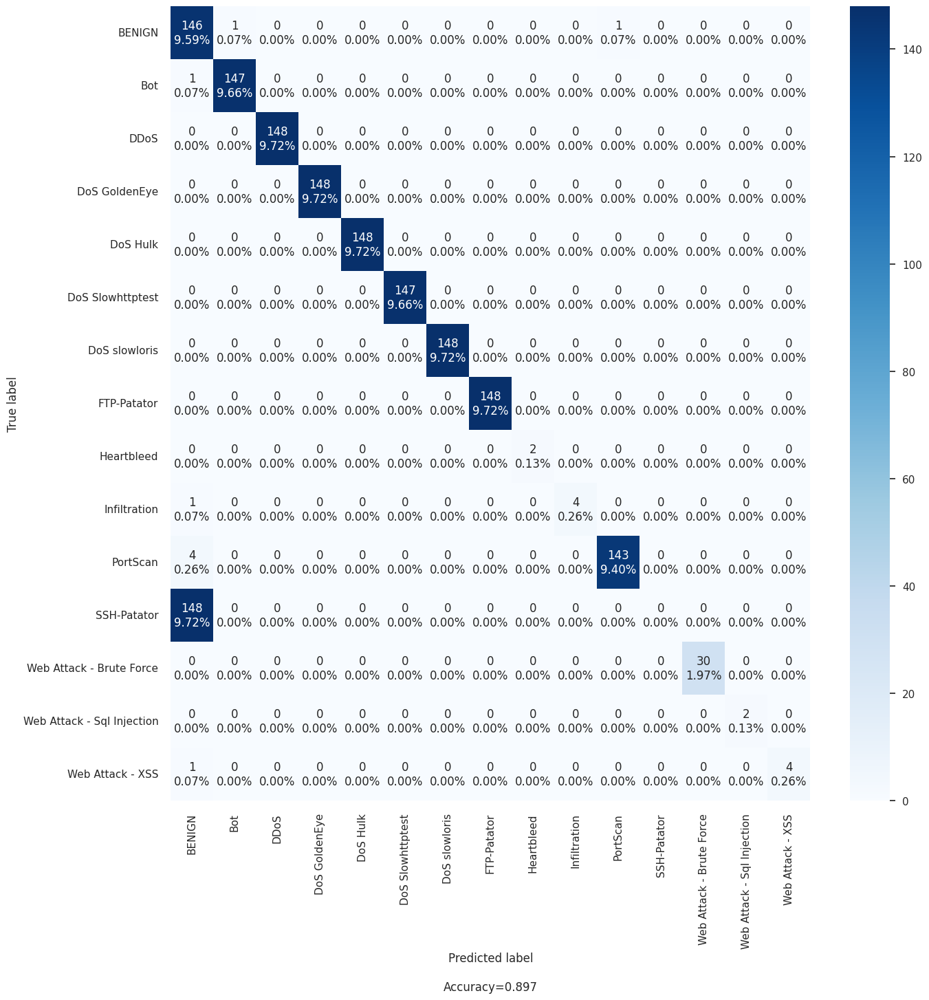

In [140]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [141]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - Brute Force']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7054198	total: 416ms	remaining: 32.9s
1:	learn: 1.3767370	total: 847ms	remaining: 33s
2:	learn: 1.1491037	total: 1.24s	remaining: 31.9s
3:	learn: 0.9858860	total: 1.6s	remaining: 30.5s
4:	learn: 0.8545924	total: 1.97s	remaining: 29.5s
5:	learn: 0.7507081	total: 2.33s	remaining: 28.7s
6:	learn: 0.6680915	total: 2.7s	remaining: 28.2s
7:	learn: 0.5979236	total: 3.09s	remaining: 27.8s
8:	learn: 0.5342204	total: 3.45s	remaining: 27.2s
9:	learn: 0.4807902	total: 3.82s	remaining: 26.8s
10:	learn: 0.4351622	total: 4.2s	remaining: 26.4s
11:	learn: 0.3948997	total: 4.58s	remaining: 26s
12:	learn: 0.3609739	total: 4.94s	remaining: 25.5s
13:	learn: 0.3303562	total: 5.31s	remaining: 25s
14:	learn: 0.3008860	total: 5.68s	remaining: 24.6s
15:	learn: 0.2778820	total: 6.04s	remaining: 24.1s
16:	learn: 0.2551659	total: 6.4s	remaining: 23.7s
17:	learn: 0.2353221	total: 6.77s	remaining: 23.3s
18:	learn: 0.2173210	total: 7.15s	remaining: 22.9s
19:	learn: 0.2014632	total: 7.52s	remaining: 22.6s


Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998156,0.973719
1,PRECISION,0.998159,0.960520
2,RECALL,0.998156,0.973719
3,F1 SCORE,0.998156,0.966246


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


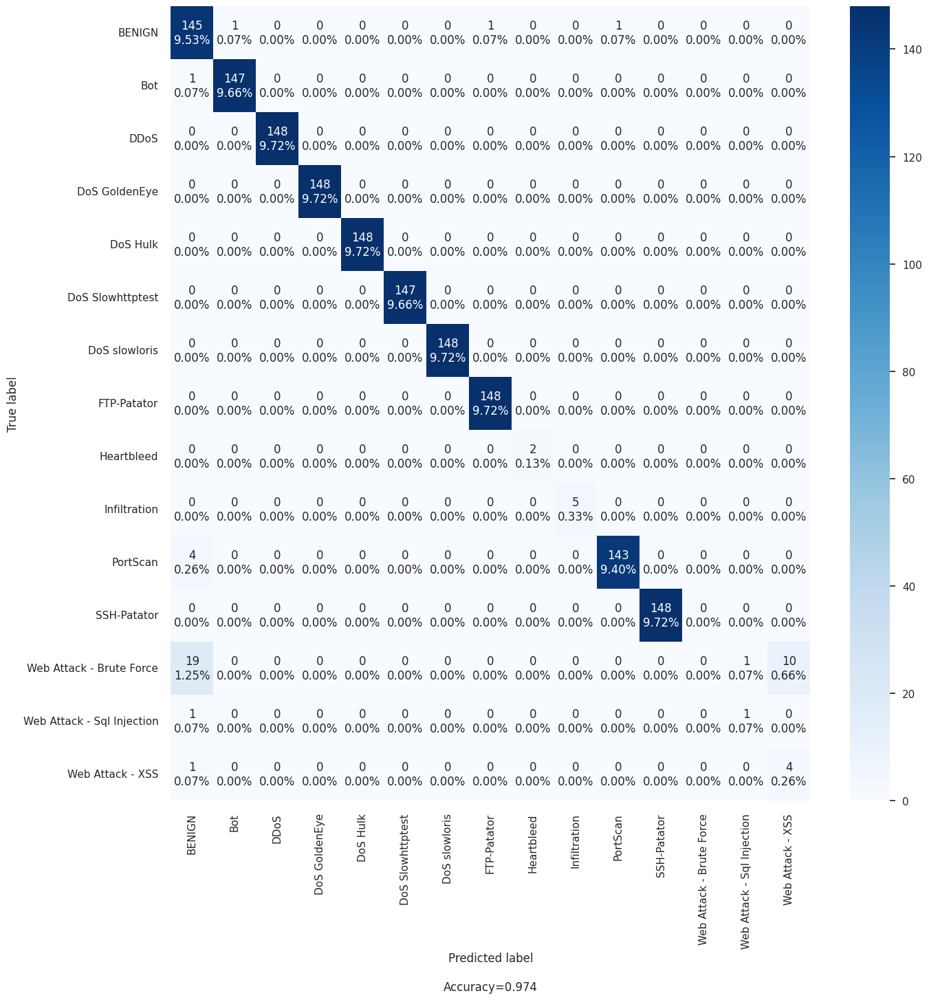

In [142]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [143]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - Sql Injection']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7459193	total: 448ms	remaining: 35.4s
1:	learn: 1.3884096	total: 858ms	remaining: 33.5s
2:	learn: 1.1652335	total: 1.23s	remaining: 31.6s
3:	learn: 0.9947012	total: 1.6s	remaining: 30.4s
4:	learn: 0.8604409	total: 1.97s	remaining: 29.6s
5:	learn: 0.7572556	total: 2.33s	remaining: 28.8s
6:	learn: 0.6734084	total: 2.69s	remaining: 28.1s
7:	learn: 0.6011138	total: 3.06s	remaining: 27.6s
8:	learn: 0.5392878	total: 3.44s	remaining: 27.1s
9:	learn: 0.4871858	total: 3.8s	remaining: 26.6s
10:	learn: 0.4399923	total: 4.16s	remaining: 26.1s
11:	learn: 0.3986149	total: 4.51s	remaining: 25.6s
12:	learn: 0.3637082	total: 4.87s	remaining: 25.1s
13:	learn: 0.3325213	total: 5.25s	remaining: 24.7s
14:	learn: 0.3027795	total: 5.63s	remaining: 24.4s
15:	learn: 0.2784357	total: 6s	remaining: 24s
16:	learn: 0.2553829	total: 6.37s	remaining: 23.6s
17:	learn: 0.2362402	total: 6.75s	remaining: 23.2s
18:	learn: 0.2177401	total: 7.12s	remaining: 22.8s
19:	learn: 0.2017856	total: 7.48s	remaining: 22.

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997532,0.992116
1,PRECISION,0.997536,0.990935
2,RECALL,0.997532,0.992116
3,F1 SCORE,0.997530,0.991460


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


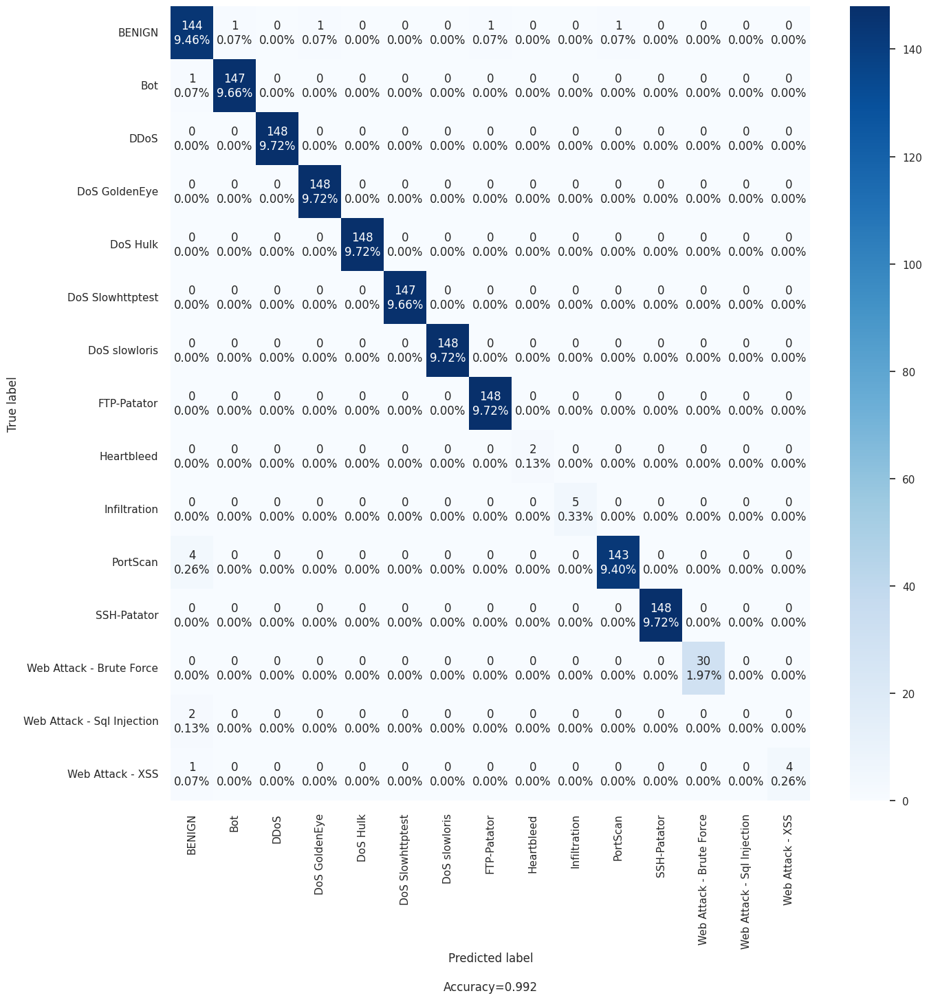

In [144]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [145]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - XSS']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7482932	total: 289ms	remaining: 22.9s
1:	learn: 1.4104323	total: 578ms	remaining: 22.6s
2:	learn: 1.1710914	total: 864ms	remaining: 22.2s
3:	learn: 1.0025003	total: 1.15s	remaining: 21.8s
4:	learn: 0.8658937	total: 1.43s	remaining: 21.5s
5:	learn: 0.7602727	total: 1.73s	remaining: 21.3s
6:	learn: 0.6734948	total: 2.02s	remaining: 21s
7:	learn: 0.6007213	total: 2.32s	remaining: 20.9s
8:	learn: 0.5382944	total: 2.61s	remaining: 20.6s
9:	learn: 0.4841794	total: 2.9s	remaining: 20.3s
10:	learn: 0.4388575	total: 3.2s	remaining: 20.1s
11:	learn: 0.3984458	total: 3.5s	remaining: 19.8s
12:	learn: 0.3621342	total: 3.79s	remaining: 19.5s
13:	learn: 0.3299073	total: 4.1s	remaining: 19.3s
14:	learn: 0.3010149	total: 4.39s	remaining: 19s
15:	learn: 0.2766207	total: 4.68s	remaining: 18.7s
16:	learn: 0.2548276	total: 4.99s	remaining: 18.5s
17:	learn: 0.2344735	total: 5.27s	remaining: 18.2s
18:	learn: 0.2166253	total: 5.57s	remaining: 17.9s
19:	learn: 0.2002606	total: 5.87s	remaining: 17.6

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998351,0.990802
1,PRECISION,0.998355,0.987895
2,RECALL,0.998351,0.990802
3,F1 SCORE,0.998351,0.989255


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


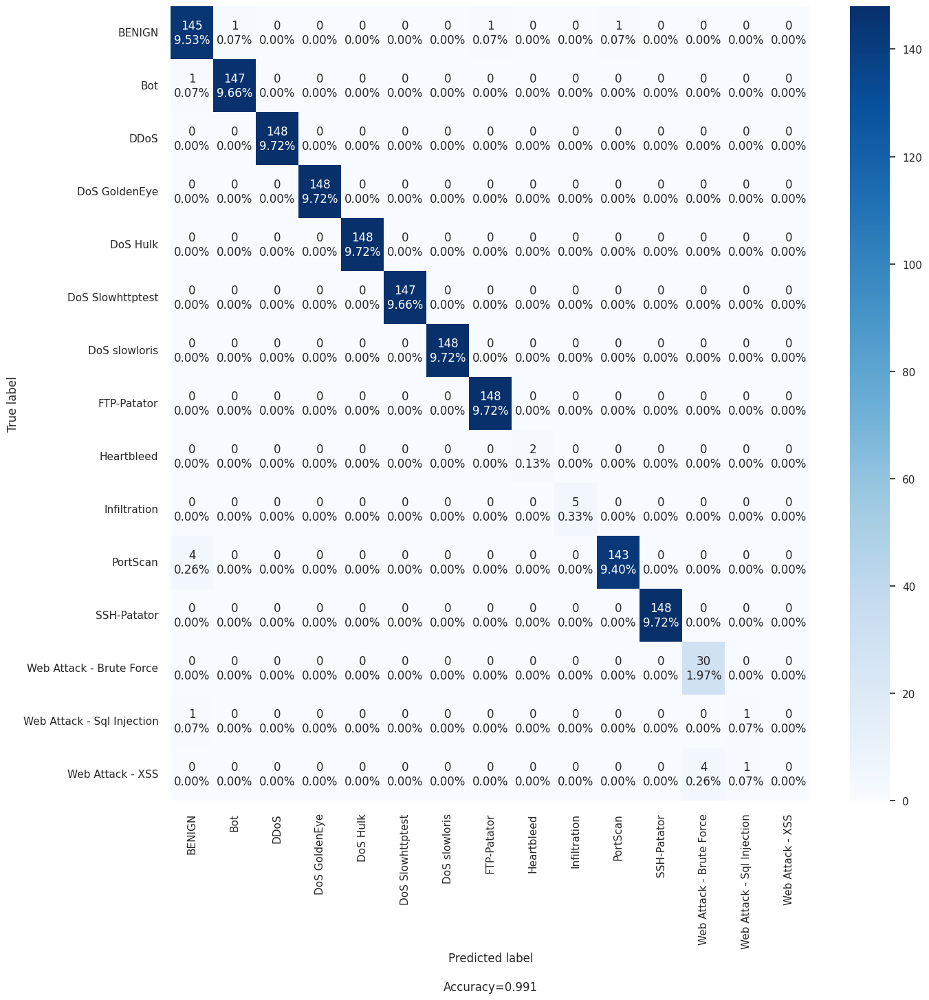

In [146]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))